# Introduction

Forecasting weather conditions is important since physical models of the atmosphere are unstable to perturbations, and thus are inaccurate for large periods of time. Mechanistic models are known to be computationally demanding. Hence, it is of interest to develop models that can predict weather conditions faster than traditional meteorological models and are more robust to perturbations. The field of machine learning has received much interest from the scientific community. Due to its applicability in a variety of fields, it is of interest to study whether machine learning models can be a good candidate for prediction of weather conditions in combination with large data sets. The availability of meteorological data from multiple online sources is an advantage.

With the changing climate conditions, it is necessary to provide accurate analysis to perform even more accurate forecasts.
In this project, I will perform some detailed exploratory data analysis of the data and attempt to generate accurate weather predictions using several machine learning models. 


## Data
The dataset that I have chosen to perform my analysis on is the [Historical Daily Weather Records](http://www.weather.gov.sg/climate-historical-daily/) for the city of Singapore. Singapore is one of the four economic tigers of Asia. Singapore is densely populated, with most citizens living in urban high-rises. The Singaporean government has forecasted exponential population growth in the coming decades and since with the increase in population, we also see a rise in certain aspects of climatological changes, it is interesting to see the trends in the weather data over the years. I chose these weather records because of their ease of availability and their detailed documentation throughout the years. The weather records are available from the years of 1983-2020. The files are mostly clean save for a few missing values for some columns. The dataset is one of the few detailed, multi-year ones that are available freely through the public domain.


True to its Southeast Asian location, Singapore is characterised by a hot and humid climate. Located just 1 degree north of the equator, it quite naturally enjoys a tropical/equatorial climate. The island does not have clear-cut seasons like summer, spring, autumn and winter. The weather is warm and humid all year round. Rainfall is almost an everyday phenomenon, even during the non-monsoon period. These brief showers are usually quite refreshing, as they provide respite from the sun.

Due to its geographical location and maritime exposure, Singapore’s climate is characterized by uniform temperature and pressure, high humidity and abundant rainfall. The average temperature is between 25 degrees Celsius and 31 degrees Celsius. Thunderstorms occur on 40% of all days. Relative humidity is in the range of 70% – 80%. April is the warmest month, January is the coolest month and November is the wettest month.

### Importing and Cleaning the data
Importing libraries necessary to perform our analysis

In [483]:
import glob
import pandas as pd
import joypy
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import plotly
import plotly_express as px
import plotly.graph_objects as go
import plotly.offline as py
import seaborn as sns
from numpy import percentile
from pyod.models.cblof import CBLOF
from pyod.models.iforest import IForest
from pyod.models.hbos import HBOS
from pyod.models.knn import KNN
from plotly.subplots import make_subplots 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from datetime import datetime
from decimal import Decimal
from matplotlib import cm
import joblib 
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from yellowbrick.classifier import ClassificationReport
from tensorflow import keras
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras import layers
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras import utils

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

mpl.rcParams["figure.dpi"] = 300
mpl.rcParams['xtick.labelsize']=14
mpl.rcParams['ytick.labelsize']=14
%matplotlib inline
%config InlineBackend.figure_format ='retina'



In [323]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function, unicode_literals

Since the files available from the Singapore met Office website were individual csv file for every month of every year from 1983-2020, there were close to 450 individual csv files so it was necessary to combine them all to form one comprehensive dataset that encompasses all the csv files. We do that by concatenating the files together.

In [203]:
raw = pd.concat(
    [pd.read_csv(f,encoding = 'unicode_escape') for f in glob.glob("C:/Users/krish/Desktop/ADS/Project/DataRaw/*.csv")], ignore_index=True,)

In [204]:
raw.head(5)

,Station,Year,Month,Day,Daily Rainfall Total (mm),Highest 30 Min Rainfall (mm),Highest 60 Min Rainfall (mm),Highest 120 Min Rainfall (mm),Mean Temperature (Â°C),Maximum Temperature (Â°C),Minimum Temperature (Â°C),Mean Wind Speed (km/h),Max Wind Speed (km/h),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C)
0,Changi,1983,1,1,0.3,â,â,â,26.5,28.7,25.1,5.5,29.9,NaN,NaN,NaN
1,Changi,1983,1,2,0.4,â,â,â,26.8,30.6,24.8,9.4,43.2,NaN,NaN,NaN
2,Changi,1983,1,3,2.9,â,â,â,27.0,31.3,24.5,10.7,42.8,NaN,NaN,NaN
3,Changi,1983,1,4,0.0,â,â,â,27.3,30.8,25.0,12.6,42.1,NaN,NaN,NaN
4,Changi,1983,1,5,0.0,â,â,â,27.1,31.8,23.7,10.3,34.6,NaN,NaN,NaN


The below code adds one more column to the dataset called the Date column which is the combination of the Year, month and day column.

In [205]:
raw["Date"] = pd.to_datetime(
    raw["Year"].astype(str)
    + "-"
    + raw["Month"].astype(str)
    + "-"
    + raw["Day"].astype(str)
)

The below code adds the month name and quarter to the dataset

In [206]:
raw["Month_Name"] = raw["Date"].dt.month_name()
raw["Quarter"] = raw["Date"].dt.quarter

In [207]:
raw.shape

(13576, 19)

Converting values in the Max/Mean Wind into numeric data type

In [208]:
raw["Max Wind Speed (km/h)"] = pd.to_numeric(
    raw["Max Wind Speed (km/h)"], errors="coerce"
)
raw["Mean Wind Speed (km/h)"] = pd.to_numeric(
    raw["Mean Wind Speed (km/h)"], errors="coerce"
)

In [209]:
raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13576 entries, 0 to 13575
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Station                        13576 non-null  object        
 1   Year                           13576 non-null  int64         
 2   Month                          13576 non-null  int64         
 3   Day                            13576 non-null  int64         
 4   Daily Rainfall Total (mm)      13576 non-null  float64       
 5   Highest 30 Min Rainfall (mm)   13576 non-null  object        
 6   Highest 60 Min Rainfall (mm)   13576 non-null  object        
 7   Highest 120 Min Rainfall (mm)  13576 non-null  object        
 8   Mean Temperature (Â°C)         13483 non-null  float64       
 9   Maximum Temperature (Â°C)      13483 non-null  float64       
 10  Minimum Temperature (Â°C)      13483 non-null  float64       
 11  Mean Wind Speed

As we saw before, there are certainly some null entries in the maximum and mean wind speed columns so we fill them with their means

In [210]:
raw["Max Wind Speed (km/h)"] = raw["Max Wind Speed (km/h)"].fillna(
    raw["Max Wind Speed (km/h)"].mean()
)
raw["Mean Wind Speed (km/h)"] = raw["Mean Wind Speed (km/h)"].fillna(
    raw["Mean Wind Speed (km/h)"].mean()
)

Dropping columns that I won't need for visualisation or modelling

In [211]:
raw = raw.drop(
    columns=[
        "Station",
        "Highest 30 Min Rainfall (mm)",
        "Highest 60 Min Rainfall (mm)",
        "Highest 120 Min Rainfall (mm)",
    ]
)

Some of the columns are a bit unordered so we put them in the right place 

In [212]:
cols = [
    "Date",
    "Year",
    "Month",
    "Month_Name",
    "Quarter",
    "Day",
    "Daily Rainfall Total (mm)",
    "Mean Temperature (°C)",
    "Maximum Temperature (°C)",
    "Minimum Temperature (°C)",
    "Mean Wind Speed (km/h)",
    "Max Wind Speed (km/h)",
]

#### Weather Dataset

In [343]:
weather = raw[cols].copy()

In [344]:
weather = weather.sort_values('Date', ascending=False)

In [346]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13422 entries, 0 to 13421
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       13422 non-null  object 
 1   Year                       13422 non-null  int64  
 2   Month                      13422 non-null  int64  
 3   Month_Name                 13422 non-null  object 
 4   Quarter                    13422 non-null  int64  
 5   Day                        13422 non-null  int64  
 6   Daily Rainfall Total (mm)  13422 non-null  float64
 7   Mean Temperature (°C)      13422 non-null  float64
 8   Maximum Temperature (°C)   13422 non-null  float64
 9   Minimum Temperature (°C)   13422 non-null  float64
 10  Mean Wind Speed (km/h)     13422 non-null  float64
 11  Max Wind Speed (km/h)      13422 non-null  float64
dtypes: float64(6), int64(4), object(2)
memory usage: 1.3+ MB


There are no null entries as we can see from the above information

In [347]:
weather.columns

Index(['Date', 'Year', 'Month', 'Month_Name', 'Quarter', 'Day',
       'Daily Rainfall Total (mm)', 'Mean Temperature (°C)',
       'Maximum Temperature (°C)', 'Minimum Temperature (°C)',
       'Mean Wind Speed (km/h)', 'Max Wind Speed (km/h)'],
      dtype='object')

In [348]:
weather.head(5)

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
0,2019-09-30,2019,9,September,3,30,1.4,27.5,31.3,25.1,6.8,34.2
1,2019-09-29,2019,9,September,3,29,0.0,28.4,33.3,26.5,6.8,41.4
2,2019-09-28,2019,9,September,3,28,0.0,28.9,34.3,26.0,7.6,29.5
3,2019-09-27,2019,9,September,3,27,0.0,29.2,34.1,26.8,9.7,30.6
4,2019-09-26,2019,9,September,3,26,0.0,28.5,33.5,25.4,9.0,31.0


In [349]:
weather.describe()

,Year,Month,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
count,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000,13422.000000
mean,2000.875950,6.492326,2.498361,15.728654,5.815281,27.667151,31.518246,24.902637,7.445743,34.056342
std,10.608927,3.439891,1.114069,8.799939,14.413763,1.176099,1.571405,1.268748,3.480851,8.037197
min,1983.000000,1.000000,1.000000,1.000000,0.000000,22.800000,23.600000,20.200000,0.200000,4.700000
25%,1992.000000,4.000000,2.000000,8.000000,0.000000,26.900000,30.800000,24.000000,4.800000,28.800000
50%,2001.000000,7.000000,3.000000,16.000000,0.000000,27.700000,31.800000,24.900000,6.800000,33.100000
75%,2010.000000,9.000000,3.000000,23.000000,4.400000,28.600000,32.500000,25.800000,9.700000,38.200000
max,2019.000000,12.000000,4.000000,31.000000,216.200000,30.900000,36.000000,29.100000,22.200000,90.700000


#### Monthly_rain dataset
We have a csv file named monthly_rain.csv and we do the same kind of preprocessing on it that we did with the above dataset. The monthly_rain dataset consists of the total monthly rainfall and the year and month for the rainfall

In [219]:
monthly_rain = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\DataRaw\monthly_data/monthly_rain.csv', encoding = 'unicode_escape')

In [220]:
monthly_rain["month"] = pd.to_datetime(monthly_rain["month"])
monthly_rain["year"] = monthly_rain["month"].dt.year
monthly_rain["month"] = monthly_rain["month"].dt.month

In [221]:
monthly_rain = monthly_rain.rename(columns = {"year": "Year", 
                                              "month": "Month", 
                                              "total_rainfall": "Total_Monthly_Rainfall (mm)"})

In [222]:
# For consistency with the daily records, I'll start with entries from 1983 for the monthly datasets as well 
cols_rain = ["Total_Monthly_Rainfall (mm)", "Year", "Month"]
monthly_rain = monthly_rain[cols_rain].copy()
monthly_rain = monthly_rain[monthly_rain["Year"] >= 1983]

In [223]:
monthly_rain.tail()

,Total_Monthly_Rainfall (mm),Year,Month
445,31.6,2019,2
446,72.2,2019,3
447,174.8,2019,4
448,69.0,2019,5
449,173.8,2019,6


In [224]:
monthly_rain.describe()

,Total_Monthly_Rainfall (mm),Year,Month
count,438.000000,438.000000,438.000000
mean,178.350457,2000.753425,6.458904
std,112.684336,10.550670,3.455755
min,0.200000,1983.000000,1.000000
25%,94.050000,1992.000000,3.000000
50%,160.100000,2001.000000,6.000000
75%,239.950000,2010.000000,9.000000
max,765.900000,2019.000000,12.000000




#### Mean_temp dataset
The mean_temp dataset contains the mean temperatures for all the months ordered according to their years. This will be particularly useful when we want to visualize our data

In [225]:
mean_temp = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\DataRaw\monthly_data/monthly_temp_mean.csv')

In [226]:
mean_temp["month"] = pd.to_datetime(mean_temp["month"])
mean_temp["year"] = mean_temp["month"].dt.year
mean_temp["month"] = mean_temp["month"].dt.month

In [227]:
mean_temp = mean_temp.rename(
    columns={
        "year": "Year",
        "month": "Month",
        "mean_temp": "Mean_Monthly_Temperature (°C)",
    }
)

In [228]:
cols_temp_mean = ["Mean_Monthly_Temperature (°C)", "Year", "Month"]
mean_temp = mean_temp[cols_temp_mean].copy()
mean_temp = mean_temp[mean_temp["Year"] >= 1983]

In [229]:
mean_temp.head(5)

,Mean_Monthly_Temperature (°C),Year,Month
12,26.5,1983,1
13,28.1,1983,2
14,28.9,1983,3
15,29.4,1983,4
16,28.3,1983,5


#### Max_temp dataset
The max_temp dataset contains the maximum temperature divided by the months

In [230]:
max_temp = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\DataRaw\monthly_data/monthly_temp_max.csv')

In [231]:
max_temp["month"] = pd.to_datetime(max_temp["month"])
max_temp["year"] = max_temp["month"].dt.year
max_temp["month"] = max_temp["month"].dt.month

In [232]:
max_temp = max_temp.rename(
    columns={
        "year": "Year",
        "month": "Month",
        "max_temperature": "Max_Monthly_Temperature (°C)",
    }
)

In [233]:
cols_temp_max = ["Max_Monthly_Temperature (°C)", "Year", "Month"]
max_temp = max_temp[cols_temp_max].copy()
max_temp = max_temp[max_temp["Year"] >= 1983]

#### Temp_max dataset
The temp_max dataset contains the maximum temperature per month sorted by the years.

In [234]:
temp_max = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\Data/max_temp_monthly.csv')

In [235]:
temp_max.head()

,Max_Monthly_Temperature (°C),Year,Month
0,32.1,1983,1
1,34.6,1983,2
2,35.8,1983,3
3,35.8,1983,4
4,34.0,1983,5


In [236]:
temp_max.describe()

,Max_Monthly_Temperature (°C),Year,Month
count,438.000000,438.000000,438.000000
mean,33.372831,2000.753425,6.458904
std,0.822519,10.550670,3.455755
min,31.300000,1983.000000,1.000000
25%,32.800000,1992.000000,3.000000
50%,33.300000,2001.000000,6.000000
75%,33.900000,2010.000000,9.000000
max,36.000000,2019.000000,12.000000


#### Temp_mean
The temp_mean dataset contains the mean monthly temperature per year and month spanning from 1983 to 2019

In [237]:
temp_mean = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\Data/mean_temp_monthly.csv')

In [238]:
temp_mean.head()

,Mean_Monthly_Temperature (°C),Year,Month
0,26.5,1983,1
1,28.1,1983,2
2,28.9,1983,3
3,29.4,1983,4
4,28.3,1983,5


In [239]:
temp_mean.describe()

,Mean_Monthly_Temperature (°C),Year,Month
count,438.000000,438.000000,438.000000
mean,27.655251,2000.753425,6.458904
std,0.804170,10.550670,3.455755
min,25.400000,1983.000000,1.000000
25%,27.100000,1992.000000,3.000000
50%,27.700000,2001.000000,6.000000
75%,28.300000,2010.000000,9.000000
max,29.500000,2019.000000,12.000000


#### Monthly_rain dataset
The monthly_rain dataset contains the total monthly rainfall per month sorted by the year going from 1983 to 2019

In [240]:
monthly_rain = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\Data/rain_monthly.csv')

In [241]:
monthly_rain.head()

,Total_Monthly_Rainfall (mm),Year,Month
0,246.0,1983,1
1,5.6,1983,2
2,18.6,1983,3
3,33.6,1983,4
4,160.8,1983,5


#### Max_temp dataset
The max_temp dataset is just the pivoted temp_max dataset and provides the maximum temperatures in every month starting from the year 1983 and going towards 2019

In [257]:
max_temp = temp_max.pivot('Month', 'Year', 'Max_Monthly_Temperature (°C)')
max_temp.head()

Year,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Month,,,,,,,,,,,,,,,,,,,,,
1,32.1,31.7,33.0,31.4,31.4,33.1,32.8,32.1,33.1,31.8,...,32.3,32.4,32.5,35.2,31.8,32.4,32.8,33.7,33.2,33.4
2,34.6,31.5,33.7,33.2,33.0,33.8,33.3,34.0,33.5,33.1,...,35.2,33.5,32.9,32.5,33.8,33.6,32.7,32.4,33.5,34.1
3,35.8,32.8,33.3,32.7,33.3,34.7,32.5,34.7,34.0,34.7,...,35.5,33.5,33.2,33.8,34.4,34.4,34.1,33.3,34.2,34.8
4,35.8,32.7,34.2,32.8,34.6,33.7,34.5,35.0,34.1,34.6,...,34.5,33.1,32.9,34.9,34.5,34.4,35.0,34.4,35.0,34.5
5,34.0,32.9,33.6,33.4,33.2,34.2,33.3,34.6,33.2,34.1,...,35.2,35.3,33.7,33.9,33.8,34.2,34.6,32.8,34.2,34.7


#### Mean_temp dataset
The mean_temp dataset is just the pivoted temp_mean dataset and provides the mean temperatures in every month starting from the year 1983 and going towards 2019

In [258]:
mean_temp = temp_mean.pivot('Month', 'Year', 'Mean_Monthly_Temperature (°C)')
mean_temp.head()


Year,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Month,,,,,,,,,,,,,,,,,,,,,
1,26.5,25.5,26.6,25.7,25.5,26.8,26.5,26.2,26.7,26.6,...,27.5,26.3,26.7,27.1,26.2,26.9,28.3,26.9,26.1,28.0
2,28.1,25.8,27.0,26.9,26.6,27.1,26.6,27.6,27.1,27.5,...,28.9,27.3,27.2,26.5,27.2,27.0,27.8,26.9,27.2,28.2
3,28.9,26.5,27.1,26.4,27.5,27.3,26.3,28.2,27.8,28.2,...,28.6,27.1,27.0,28.3,27.9,28.2,29.0,27.4,28.0,28.7
4,29.4,27.3,27.5,27.4,27.9,27.8,27.0,28.5,27.7,28.4,...,28.6,27.9,27.6,28.2,28.2,28.6,29.4,27.8,28.5,28.6
5,28.3,27.3,28.0,28.2,27.6,28.4,27.3,28.6,27.7,28.1,...,29.2,28.5,28.2,28.2,28.6,28.7,29.3,28.5,28.7,29.3


### Visualizing the Heat in Singapore

Compared to countries in the temperate regions, temperatures in Singapore vary little from month to month and also from day to day.  The daily temperature range has a  minimum usually not falling below 23-25ºC during the night and maximum not rising above 31-33ºC during the day. May and June has the highest average monthly temperature (24-hour mean of 27.8ºC) and December and January are the coolest (24-hour mean of 26.0ºC).  Singapore, being an island, also has a coastal climate.  The proximity of the sea has a moderating influence on its climate. This is because water has a larger heat capacity than the land surface, and a greater amount of heat is required to increase the sea temperatures.  During afternoons, conditions at the coast are often relieved by sea breezes. The presence of significant wind speeds, rainfall and cloud cover are the most important natural influences in mitigating the tropical heat.

Due to its geographical location and maritime exposure, Singapore’s climate is characterised by uniform temperature and pressure, high humidity and abundant rainfall.

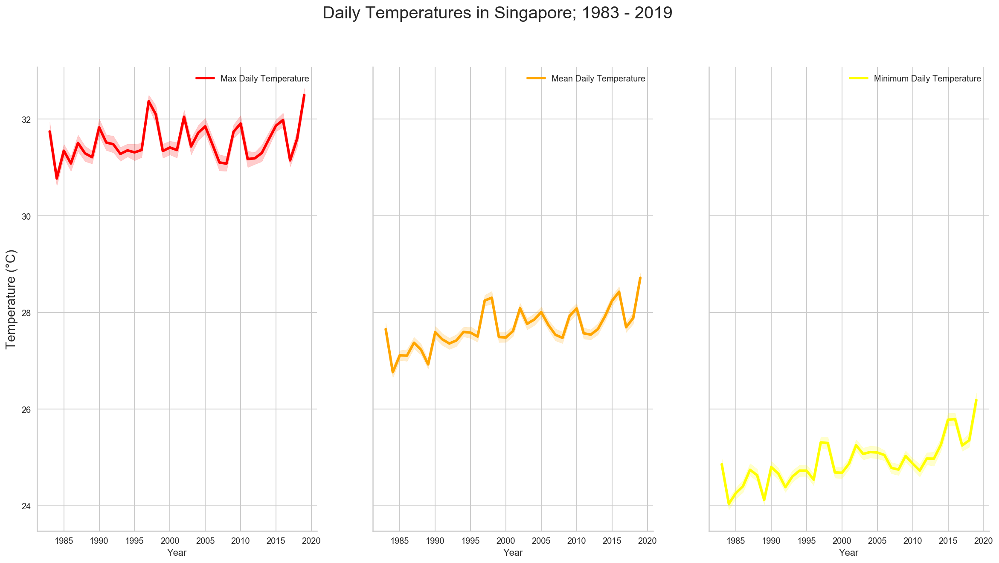

In [254]:
fig, axs = plt.subplots(1, 3, figsize=(20, 10), sharey=True)
sns.lineplot(
    x=weather["Year"],
    y=weather["Maximum Temperature (°C)"],
    linewidth=3,
    data=weather,
    label="Max Daily Temperature",
    color="red",
    ax=axs[0],
)
sns.lineplot(
    x="Year",
    y="Mean Temperature (°C)",
    linewidth=3,
    data=weather,
    label="Mean Daily Temperature",
    color="orange",
    ax=axs[1],
)
sns.lineplot(
    x="Year",
    y="Minimum Temperature (°C)",
    linewidth=3,
    data=weather,
    label="Minimum Daily Temperature",
    color="yellow",
    ax=axs[2],
)
fig.suptitle("Daily Temperatures in Singapore; 1983 - 2019", fontsize=20)
axs[0].set_ylabel("Temperature (°C)", fontsize=15)
sns.despine()
plt.show()

There can be no more apparent plot than a line plot when visualizing the apparent changes in a variable over the years and this becomes more obvious as we visualize the line plots for the maximum, mean and minimum temperature in Singapore over 4 decades. As seen from the graphs, the temperatures have risen almost steadily over the years and the peak maximum temperature was reached in the years 1997 and 2020. However, we see that the mean temperature for the year of 2020 is the highest with 1997 trailing closely behind. We can see the same for the minimum temperatures too where 2020 logs the highest minimum temperature. It is also interesting to see that the year of 1984 records the least maximum, mean and minimum temperatures. It wouldn't be a mistake to crown it as the coolest year on record for Singapore

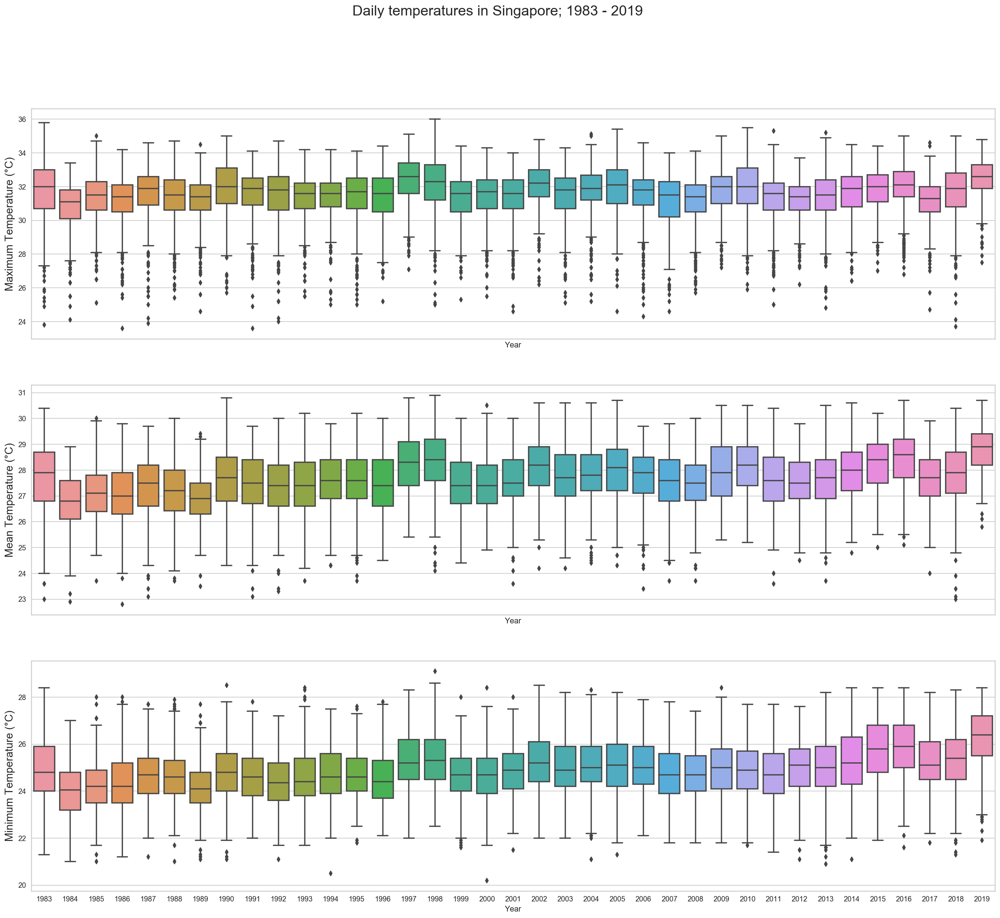

In [255]:
fig, axs = plt.subplots(3, 1, figsize=(24, 20), sharex=True)
sns.boxplot(y="Maximum Temperature (°C)", x="Year", data=weather, ax=axs[0])
sns.boxplot(y="Mean Temperature (°C)", x="Year", data=weather, ax=axs[1])
sns.boxplot(y="Minimum Temperature (°C)", x="Year", data=weather, ax=axs[2])
fig.suptitle(
    " Daily temperatures in Singapore; 1983 - 2019 ", fontsize=20
)
axs[0].set_ylabel("Maximum Temperature (°C)", fontsize=15)
axs[1].set_ylabel("Mean Temperature (°C)", fontsize=15)
axs[2].set_ylabel("Minimum Temperature (°C)", fontsize=15)
plt.show()

Line plots are especially useful when it comes to looking at the trend over a certain period of time, however, we need to take a closer look at the statistics here and for that we use Box plots.

In descriptive statistics, a boxplot is a method for graphically depicting groups of numerical data through their quartiles. Box plots may also have lines extending from the boxes (whiskers) indicating variability outside the upper and lower quartiles, hence the terms box-and-whisker plot and box-and-whisker diagram. Outliers may be plotted as individual points. Box plots are non-parametric: they display variation in samples of a statistical population without making any assumptions of the underlying statistical distribution.

Through the boxplots we can see at a glance which years have how many outliers and which are the years where higher or lower than normal temperatures were seen.

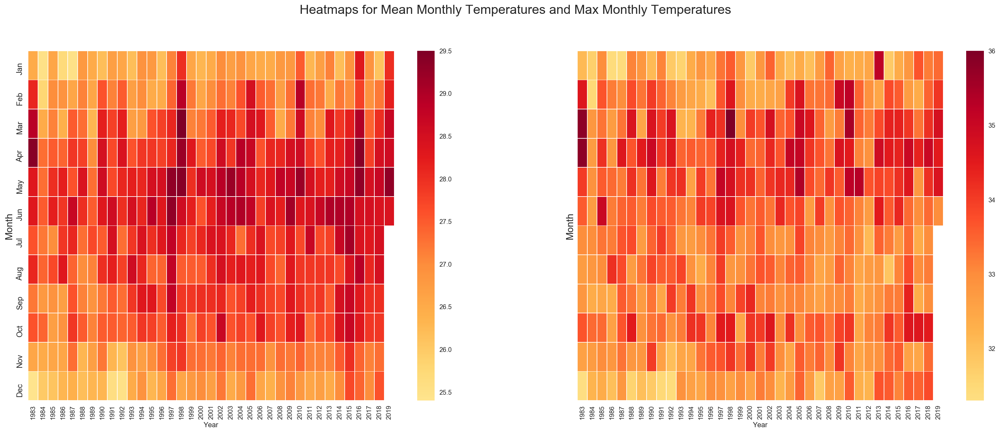

In [259]:
fig, axs = plt.subplots(1, 2, figsize=(28, 10), sharey=True)

sns.heatmap(
    mean_temp,
    linewidths=0.5,
    cmap="YlOrRd",
    center=27,
    ax=axs[0]
    )

sns.heatmap(
    max_temp,
    linewidths=0.5,
    cmap="YlOrRd",
    center=33,
    ax=axs[1]
    )
fig.suptitle("Heatmaps for Mean Monthly Temperatures and Max Monthly Temperatures", fontsize=20)
axs[0].set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=12)
axs[0].set_ylabel("Month", fontsize=15)
axs[1].set_ylabel("Month", fontsize=15)
plt.show()

A heat map (or heatmap) is a data visualization technique that shows magnitude of a phenomenon as color in two dimensions. The variation in color may be by hue or intensity, giving obvious visual cues to the reader about how the phenomenon is clustered or varies over space.
Though normally, it is used to show the correlation between different variables in a particular dataset, we take the word heatmap quite literally here and plot the heat experienced in Singapore over the years. This visualization is particularly easy to grasp as we can see that the darker the hue here, the hotter it is. And just from that, we can see that the months of May and June are particularly hot and seem to log intense temperatures.

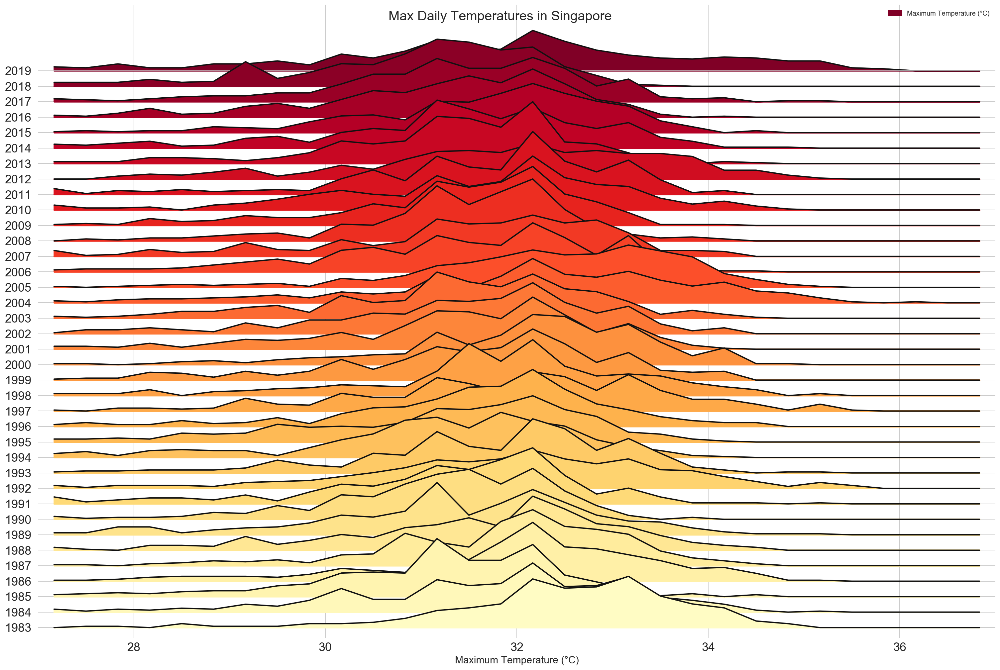

In [260]:
fig, axes = joypy.joyplot(weather, by="Year", column="Maximum Temperature (°C)",
                   kind="normalized_counts", bins=30,
                   range_style='all', x_range=[27, 37],
                   overlap=2, linewidth=2, colormap=cm.YlOrRd_r,
                   legend = True,
                   ylabelsize = 18, xlabelsize = 18, 
                   labels=weather.Year.unique(), grid='both', figsize=(21,14))
fig.suptitle("Max Daily Temperatures in Singapore", fontsize=20)
plt.xlabel("Maximum Temperature (°C)", fontsize=15)
plt.ylabel("Year", fontsize=15)
plt.show()

A Ridgeline plot (sometimes called Joyplot) shows the distribution of a numeric value for several groups. Distribution can be represented using histograms or density plots, all aligned to the same horizontal scale and presented with a slight overlap. Ridgeline plots make sense when the number of group to represent is medium to high, and thus a classic window separation would take to much space. Indeed, the fact that groups overlap each other allows to use space more efficiently.

It works well when there is a clear pattern in the result, like if there is an obvious ranking in groups. Otherwise group will tend to overlap each other, leading to a messy plot not providing any insight.

They look pretty good to show the trend in the temperature daily over the years, however since we have so many years of data to show, the overlaps in the plot do not do the data any justice.

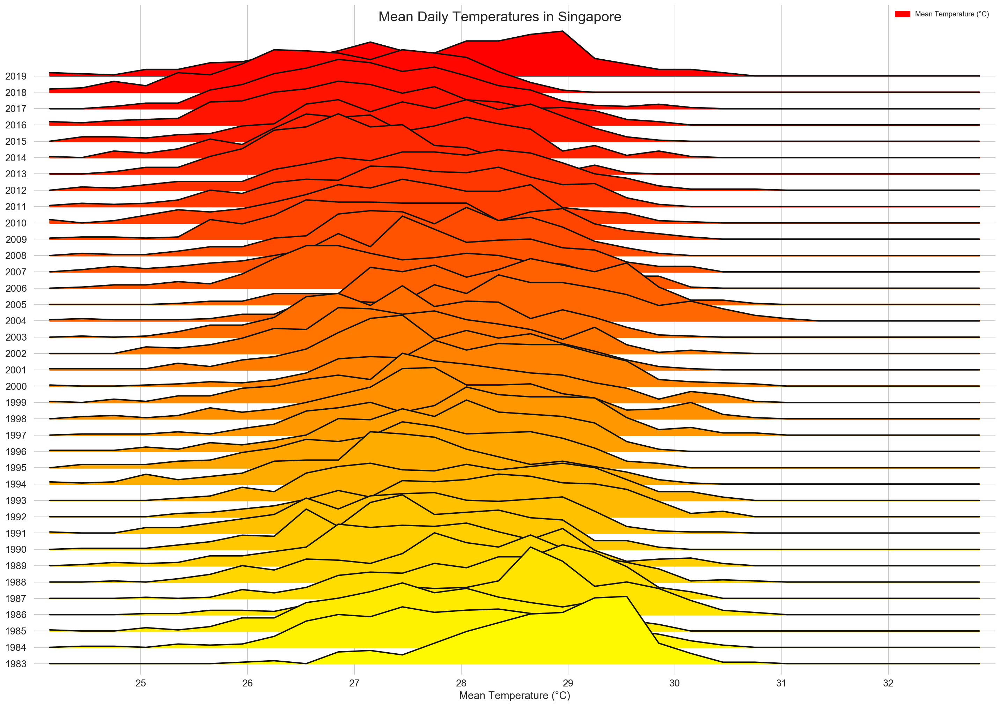

In [261]:
fig, axes = joypy.joyplot(weather, by="Year", column="Mean Temperature (°C)",
                   kind="normalized_counts", bins=30,
                   range_style='all', x_range=[24, 33],
                   overlap=2, linewidth=2, colormap=cm.autumn,
                   legend = True,
                   ylabelsize = 14, xlabelsize = 14, 
                   labels=weather.Year.unique(), grid='both', figsize=(20,14),
                   )
fig.suptitle("Mean Daily Temperatures in Singapore", fontsize=20)
plt.xlabel("Mean Temperature (°C)", fontsize=15)
plt.ylabel("Year", fontsize=15)
plt.show()

In [262]:
fig = px.scatter_3d(
    temp_max,
    x="Month",
    y="Year",
    z="Max_Monthly_Temperature (°C)",
    color="Max_Monthly_Temperature (°C)",
    size="Max_Monthly_Temperature (°C)",
    hover_name="Year",
    animation_frame="Year",
    animation_group="Year",
    color_continuous_scale=px.colors.sequential.YlOrRd,
)
fig.update_layout(
    title=go.layout.Title(
        text="3D Scatter Plot of Maximum Monthly Temperatures in Singapore"
    )
)
fig.show()

3D scatter plots have always held my curiosity with their precise multivariate ability to show the data as is and since plotly offers an interactive 3d scatter plot feature, we can visualize the change in temperature over the years and the months. It is quite a convenient feature. Plotly also offers a 3D line plot feature that I have used in the below code.

In [263]:
fig = px.line_3d(
    temp_mean,
    x="Year",
    y="Month",
    z="Mean_Monthly_Temperature (°C)",
    hover_name="Year",
    animation_frame="Year",
    animation_group="Year",
    color_discrete_sequence=px.colors.sequential.Plasma[-3::-1])
fig.update_layout(
    title=go.layout.Title(
        text="3D Line Plot of Mean Monthly Temperatures in Singapore")
)
fig.show()

### Visualizing the Rainfall in Singapore 

Rainfall is plentiful in Singapore and it rains an average of 167 days1 of the year. Much of the rain is heavy and accompanied by thunder. The 1981-2010 long-term mean annual rainfall total is 2165.9mm. 
In addition to the heat, the region also experiences heavy rainfall, however we can see that the year of 2019 saw some of the least rainfall in all these years and 2007, the highest. 

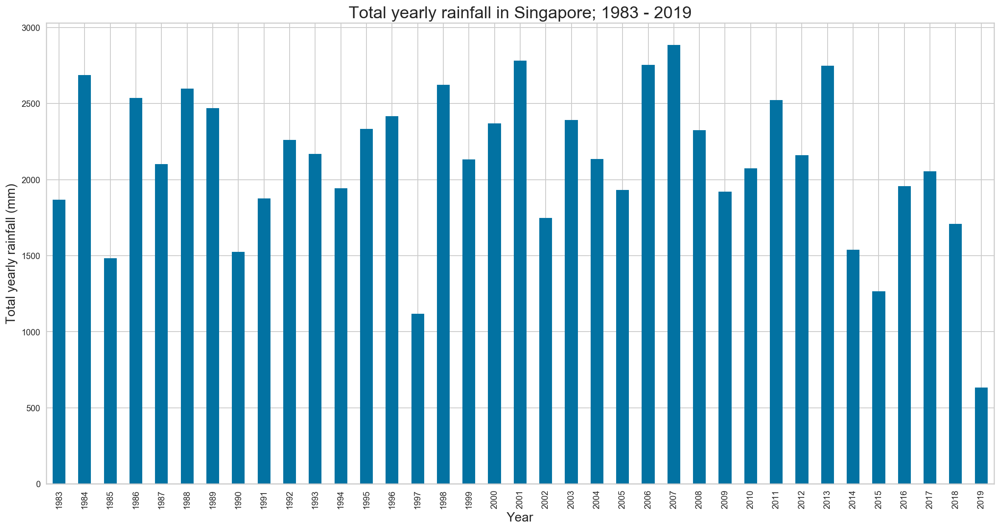

In [264]:
weather.groupby(
    ["Year"]
)['Daily Rainfall Total (mm)'].sum().plot(kind="bar", figsize=(20, 10))
plt.title('Total yearly rainfall in Singapore; 1983 - 2019', fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Total yearly rainfall (mm)", fontsize=15)
plt.show()

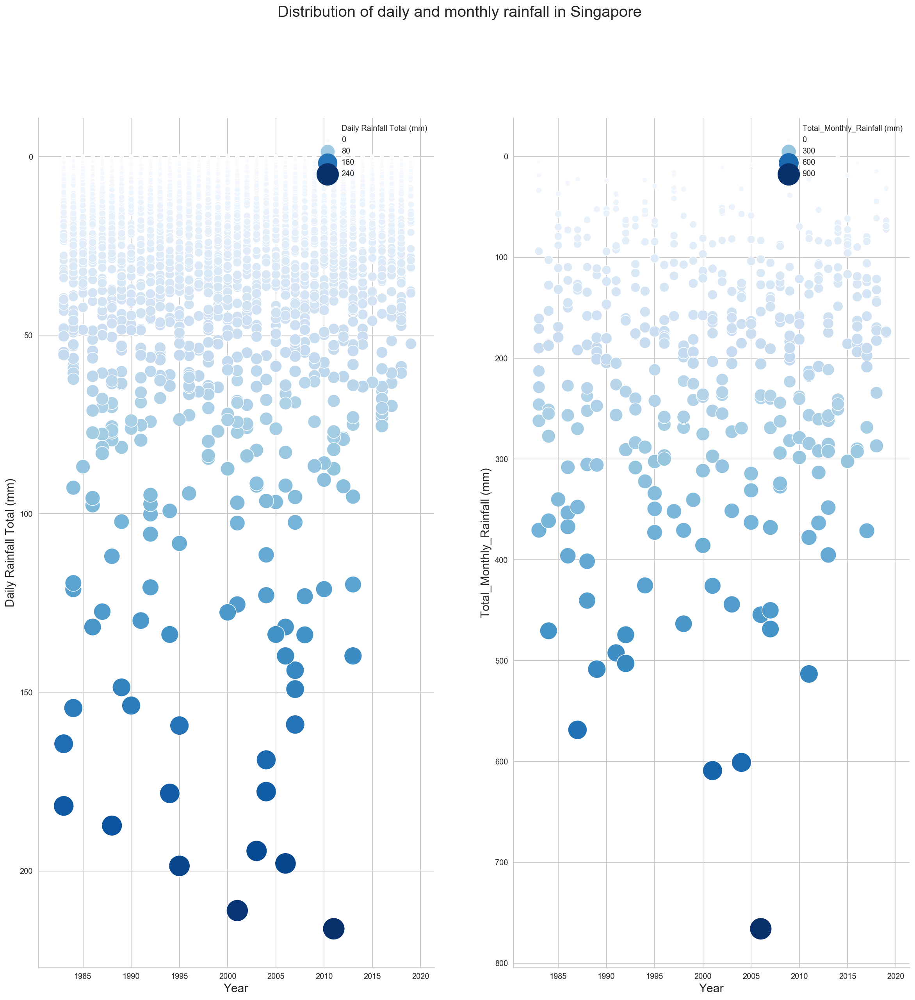

In [265]:
fig, axs = plt.subplots(1, 2, figsize=(20, 20), sharex=True)
ax = sns.scatterplot(
    x="Year",
    y="Daily Rainfall Total (mm)",
    data=weather,
    hue="Daily Rainfall Total (mm)",
    size = "Daily Rainfall Total (mm)",
    sizes=(20, 800),
    palette="Blues",
    ax=axs[0]
)
sns.scatterplot(
    x="Year",
    y="Total_Monthly_Rainfall (mm)",
    data=monthly_rain,
    hue="Total_Monthly_Rainfall (mm)",
    size = "Total_Monthly_Rainfall (mm)",
    sizes=(20, 800),
    palette="Blues",
    ax=axs[1]
)
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[0].legend(loc='upper right')
axs[1].legend(loc='upper right')
axs[0].set_xlabel("Year", fontsize=15)
axs[1].set_xlabel("Year", fontsize=15)
axs[0].set_ylabel("Daily Rainfall Total (mm)", fontsize=15)
axs[1].set_ylabel("Total_Monthly_Rainfall (mm)", fontsize=15)
fig.suptitle("Distribution of daily and monthly rainfall in Singapore", fontsize=20)
sns.despine()
plt.show()


The above graph is one of my favorite graphs as it shows a cascading pattern for the rainfall(also it looks like raindrops).
The bigger the scatter and the size of the dot, the more the rainfall. At a glance, we can surmise which years had unusual rainfall patterns and which years had a consistent pattern. The outliers in the monthly and daily rainfall data are quite apparent.


Below, we check the maximum and mean daily rainfall and we see that the maximum rainfall was observed on the 30th of January, 2011 with 216.2 mm

In [57]:
weather['Daily Rainfall Total (mm)'].max(), weather['Daily Rainfall Total (mm)'].mean()

(216.2, 5.815280882133789)

In [58]:
weather[weather['Daily Rainfall Total (mm)'] == 216.2]

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
3165,2011-01-30,2011,1,January,1,30,216.2,23.6,25.0,21.6,6.6,34.9


We check the maximum and mean monthly rainfall and we see that the December of 2006 had the most rainfall with 765.9 mm

In [59]:
monthly_rain['Total_Monthly_Rainfall (mm)'].max(), monthly_rain['Total_Monthly_Rainfall (mm)'].mean()

(765.9, 178.35045662100472)

In [60]:
monthly_rain[monthly_rain['Total_Monthly_Rainfall (mm)'] == 765.9]

,Total_Monthly_Rainfall (mm),Year,Month
287,765.9,2006,12


If we characterise daily rainfall of more than 100 mm as intense rainfall, we make the dataset for the same below and count the number of days per year that had intense rain and surprisingly, 2004 and 2007 had the days with the most intense rain

In [61]:
intense_rain = weather[weather['Daily Rainfall Total (mm)'] > 100]
intense_rain.head()

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
2127,2013-12-03,2013,12,December,4,3,119.8,25.6,30.6,23.5,5.7,27.4
2177,2013-10-14,2013,10,October,4,14,139.8,27.4,30.3,23.2,5.6,28.8
3165,2011-01-30,2011,1,January,1,30,216.2,23.6,25.0,21.6,6.6,34.9
3363,2010-07-16,2010,7,July,3,16,121.1,27.4,30.8,23.9,6.0,37.1
4071,2008-08-07,2008,8,August,3,7,133.9,27.0,31.8,22.6,10.1,48.6


In [62]:
intense_rain['Year'].value_counts().sort_index(ascending=True)

1983    2
1984    3
1986    1
1987    1
1988    2
1989    2
1990    1
1991    1
1992    3
1994    2
1995    3
2000    1
2001    3
2003    1
2004    4
2005    1
2006    3
2007    4
2008    2
2010    1
2011    1
2013    2
Name: Year, dtype: int64

In [266]:
fig = px.scatter(
    weather,
    x="Daily Rainfall Total (mm)",
    y="Year",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    hover_name="Date",
    size_max=30,
    color_continuous_scale=px.colors.sequential.PuBu
)
fig.update_layout(
    title=go.layout.Title(
        text="Heaviest daily rainfall in Singapore; 1983 - 2019"
    )
)
fig.show()

In [268]:
fig = px.scatter(
    monthly_rain,
    x="Total_Monthly_Rainfall (mm)",
    y="Year",   
    size="Total_Monthly_Rainfall (mm)",
    color="Total_Monthly_Rainfall (mm)",
    hover_name="Month",
    size_max=30,
    color_continuous_scale=px.colors.sequential.PuBu
)
fig.update_layout(
    title=go.layout.Title(
        text="Heaviest monthly rainfall in Singapore 1983 - 2019"
    )
)
fig.show()

The above 2 plots are the same that we visualized before but just in the plotly express so we can see which date had the highest rain.


### Visualizing Wind Speed in Singapore
The most prominent winds in Singapore are from the northeast and the south, reflecting the dominance of the monsoons in Singapore. On any given day, winds generally follow the prevailing monsoon flow except when light winds are being modified by terrain or weather systems (e.g., showers or thunderstorms and land or sea breezes). Wind directions are mainly from northerly to northeasterly during the Northeast Monsoon (December to March) and southerly to southeasterly during the Southwest Monsoon (June to September). Wind strength is greater during the Northeast Monsoon. The inter-monsoon months (April, May, October and November) are transition periods between the monsoons and show lighter and more variable winds.

From the plots we can see that the years of 2010, 1985 and 1994 have the days with the highest maximum wind speed and similar can be said about the mean wind speed for those years

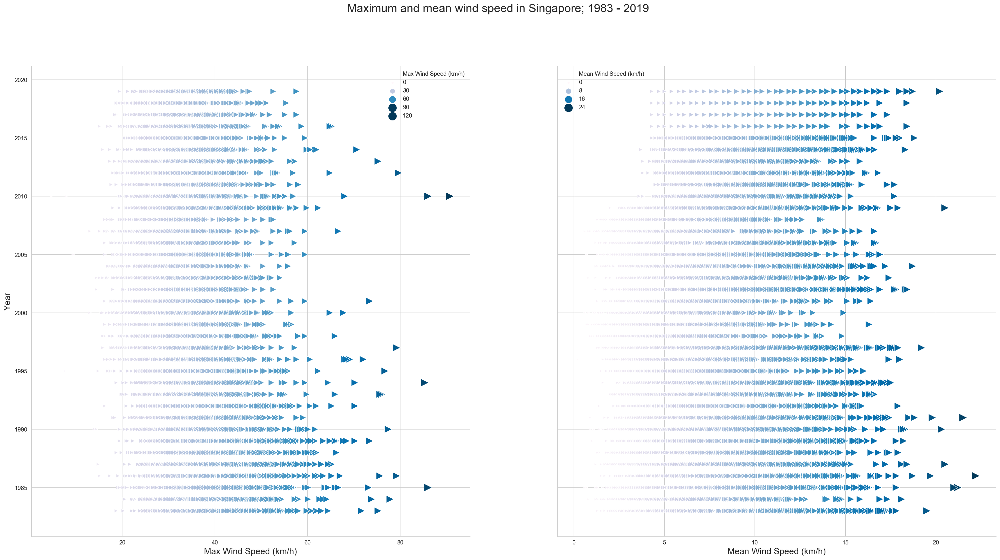

In [270]:
fig, axs = plt.subplots(1, 2, figsize=(30, 15), sharey=True)
sns.scatterplot(
    x="Max Wind Speed (km/h)",
    y="Year",
    data=weather,
    marker=">",
    sizes=(10, 200),
    size="Max Wind Speed (km/h)",
    hue="Max Wind Speed (km/h)",
    palette="PuBu",
    ax=axs[0]
)
sns.scatterplot(
    x="Mean Wind Speed (km/h)",
    y="Year",
    data=weather,
    marker=">",
    sizes=(10, 200),
    size="Mean Wind Speed (km/h)",
    hue="Mean Wind Speed (km/h)",
    palette="PuBu",
    ax=axs[1]
)
fig.suptitle("Maximum and mean wind speed in Singapore; 1983 - 2019", fontsize=20)
axs[0].set_ylabel("Year", fontsize=15)
axs[0].set_xlabel("Max Wind Speed (km/h)", fontsize=15)
axs[1].set_xlabel("Mean Wind Speed (km/h)", fontsize=15)
sns.despine()
plt.show()

Again we check which day had the highest wind speed and we see that the 29th of November in 2010 had the highest wind speed with 90.7 km/h.

In [273]:
weather['Max Wind Speed (km/h)'].max()

90.7

In [67]:
weather[weather['Max Wind Speed (km/h)'] == 90.7]

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
3227,2010-11-29,2010,11,November,4,29,30.2,26.3,31.8,23.5,5.8,90.7


In [68]:
weather['Max Wind Speed (km/h)'].mean()

34.05634180896268

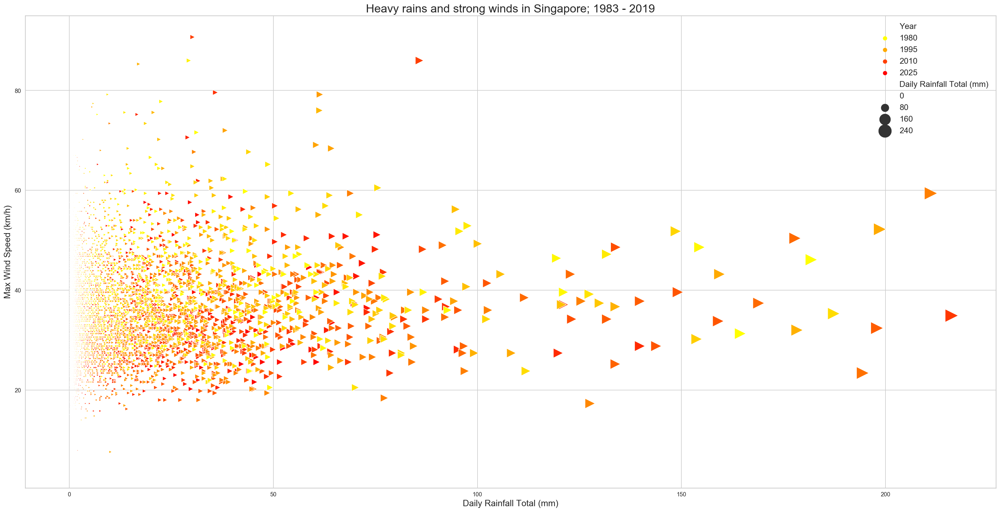

In [274]:
plt.figure(figsize=(30, 15))
sns.scatterplot(
    x="Daily Rainfall Total (mm)",
    y="Max Wind Speed (km/h)",
    data=weather,
    marker=">",
    sizes=(0, 500),
    size="Daily Rainfall Total (mm)",
    hue="Year",
    palette="autumn_r",
)
plt.title("Heavy rains and strong winds in Singapore; 1983 - 2019", fontsize=20)
plt.ylabel("Max Wind Speed (km/h)", fontsize=15)
plt.xlabel("Daily Rainfall Total (mm)", fontsize=15)
plt.legend(prop={'size':14})
plt.show()


Heavy rainfall accompanied by heavy wind are naturally associated together due to the instability they create in the atmosphere. From the graph above we see that precisely and we see that the bigger the triangle marker is, the higher the rainfall is and the color is indicative of the years rather than the wind speed which is shown on the y axis. The above graph is a simple seaborn scatter plot and though it may be useful to identify some pattern, it is not particularly useful when we want to glean any specific information through it. And so we plot the same graph as shown above, but this time we do it through plotly express so it is interactive and we can look at the dates and the rainfall and windspeed on that date.

In [276]:
fig = px.scatter(
    weather,
    x="Daily Rainfall Total (mm)",
    y="Max Wind Speed (km/h)",
    color="Year",
    size="Daily Rainfall Total (mm)",
    hover_name="Date",
    size_max=25,
    color_continuous_scale=px.colors.sequential.YlOrRd,
)
fig.update_layout(
    title=go.layout.Title(
        text="Heavy rains and strong winds in Singapore; 1983 - 2019"
    ),
    autosize=False,
    width=2200,
    height=900
)
fig.show()

The purpose of the graphs below is the same and that is to show the comparison between rainfall and maximum temperatures for 4 different years where the years have been chosen arbitrarily. I used plotly express for this again as it is convenient to see the specific values. 
As always with plotly, the larger and darker circles signal heavier downpour and the smaller and darker circles signal lower rainfall amount.

In [281]:
fig = px.scatter(
    weather.query("Year==1988"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Daily rainfall and maximum temperatures in Singapore - 1988"
    )
)
fig.show()

In [282]:
fig = px.scatter(
    weather.query("Year==1998"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Daily rainfall and maximum temperatures in Singapore - 1998"
    )
)
fig.show()

In [283]:
fig = px.scatter(
    weather.query("Year==2008"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Daily rainfall and maximum temperatures in Singapore - 2008"
    )
)
fig.show()

In [284]:
fig = px.scatter(
    weather.query("Year==2018"),
    x="Day",
    y="Maximum Temperature (°C)",
    size="Daily Rainfall Total (mm)",
    color="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Daily rainfall and maximum temperatures in Singapore - 2018"
    )
)
fig.show()

## Anomaly Detection
Data visualization as we have done before is a concise way to look for outliers in the data but since we have data for so many years, it is efficient to also do some anomaly detection to identify more outliers. Here I have used the algorithms like Cluster Based Local Outlier Factor(CBLOF), Histogram Based Outlier Detection (HBOD) and Isolation Forest from the PyOD library for outlier detection.

Anomaly detection is the process of identifying unexpected items or events in data sets, which differ from the norm. And anomaly detection is often applied on unlabeled data which is known as unsupervised anomaly detection. Anomaly detection has two basic assumptions:Anomalies only occur very rarely in the data. Their features differ from the normal instances significantly.
Most of the analysis that we end up doing are multivariate due to complexity of the world we are living in. In multivariate anomaly detection, outlier is a combined unusual score on at least two variables.

A pairplot plot a pairwise relationships in a dataset. The pairplot function creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column.

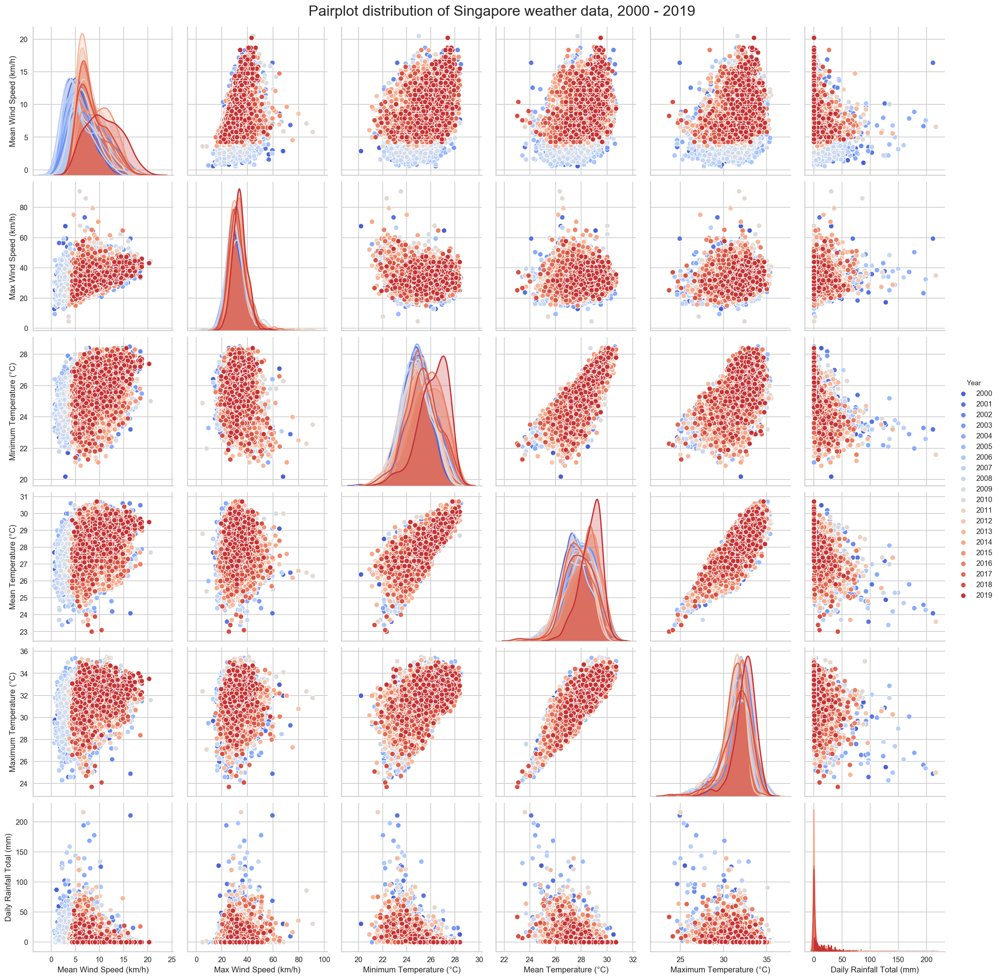

In [288]:
sns.pairplot(
    weather[weather['Year'] >=2000],
    height=3,
    vars=[
        "Mean Wind Speed (km/h)",
        "Max Wind Speed (km/h)",
        "Minimum Temperature (°C)",
        "Mean Temperature (°C)",
        "Maximum Temperature (°C)",
        "Daily Rainfall Total (mm)",
    ],
    hue="Year",
    palette="coolwarm"
)
plt.suptitle("Pairplot distribution of Singapore weather data, 2000 - 2019", fontsize=20, y=1.02)
plt.show()

Now we check the skewness and kurtosis of the data.
Skewness is a measure of symmetry, or more precisely, the lack of symmetry. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.

Positive Skewness means when the tail on the right side of the distribution is longer or fatter. The mean and median will be greater than the mode.
Negative Skewness is when the tail of the left side of the distribution is longer or fatter than the tail on the right side. The mean and median will be less than the mode.

Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution. That is, data sets with high kurtosis tend to have heavy tails, or outliers. Data sets with low kurtosis tend to have light tails, or lack of outliers. A uniform distribution would be the extreme case.

High kurtosis in a data set is an indicator that data has heavy tails or outliers. If there is a high kurtosis, then, we need to investigate why do we have so many outliers. It indicates a lot of things, maybe wrong data entry or other things. Investigate!
Low kurtosis in a data set is an indicator that data has light tails or lack of outliers. If we get low kurtosis(too good to be true), then also we need to investigate and trim the dataset of unwanted results.

Mesokurtic: This distribution has kurtosis statistic similar to that of the normal distribution. It means that the extreme values of the distribution are similar to that of a normal distribution characteristic. This definition is used so that the standard normal distribution has a kurtosis of three.

Leptokurtic (Kurtosis > 3): Distribution is longer, tails are fatter. Peak is higher and sharper than Mesokurtic, which means that data are heavy-tailed or profusion of outliers.
Outliers stretch the horizontal axis of the histogram graph, which makes the bulk of the data appear in a narrow (“skinny”) vertical range, thereby giving the “skinniness” of a leptokurtic distribution.

Platykurtic: (Kurtosis < 3): Distribution is shorter, tails are thinner than the normal distribution. The peak is lower and broader than Mesokurtic, which means that data are light-tailed or lack of outliers.
The reason for this is because the extreme values are less than that of the normal distribution.

The results from our code show that there are many outliers in the data so it will make sense to observe them more.

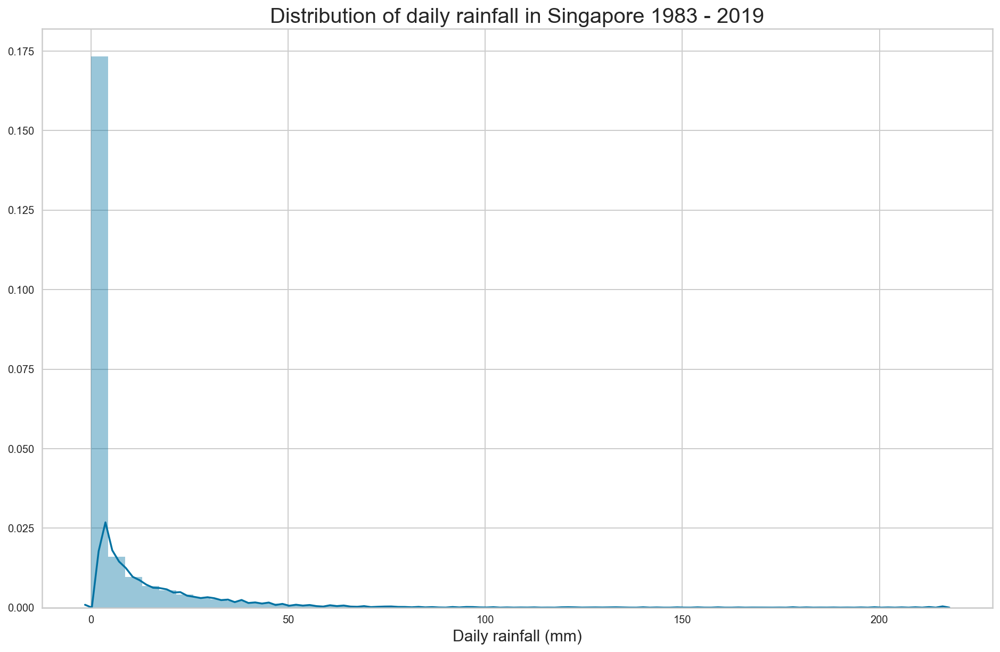

In [289]:
plt.figure(figsize=(16,10))
sns.distplot(weather['Daily Rainfall Total (mm)'])
plt.title('Distribution of daily rainfall in Singapore 1983 - 2019', fontsize=20)
plt.xlabel("Daily rainfall (mm)", fontsize=15)
plt.show()

In [81]:
print("Skewness: %f" % weather['Daily Rainfall Total (mm)'].skew())
print("Kurtosis: %f" % weather['Daily Rainfall Total (mm)'].kurt())

Skewness: 5.157295
Kurtosis: 41.039555


### Univariate Anomaly Detection

First we perform univariate anomaly detection with daily total rainfall

Isolation Forest is an algorithm to detect outliers that returns the anomaly score of each sample using the IsolationForest algorithm which is based on the fact that anomalies are data points that are few and different. Isolation Forest is a tree-based model. In these trees, partitions are created by first randomly selecting a feature and then selecting a random split value between the minimum and maximum value of the selected feature.
The following process shows how IsolationForest behaves in the case of the Susperstore’s sales, and the algorithm was implemented in Sklearn : 

Trained IsolationForest using the weather data.

Store the weather data in the NumPy array for using in our models later.

Computed the anomaly score for each observation. The anomaly score of an input sample is computed as the mean anomaly score of the trees in the forest.

Classified each observation as an outlier or non-outlier.

The visualization highlights the regions where the outliers fall.


In [290]:
isolation_forest = IsolationForest(
    behaviour="new", n_estimators=500, n_jobs=-1, random_state=42, contamination=0.1
)

isolation_forest.fit(weather["Daily Rainfall Total (mm)"].values.reshape(-1, 1))

C:\Users\krish\anaconda3\lib\site-packages\sklearn\ensemble\_iforest.py:248: FutureWarning:

'behaviour' is deprecated in 0.22 and will be removed in 0.24. You should not pass or set this parameter.



IsolationForest(behaviour='new', bootstrap=False, contamination=0.1,
                max_features=1.0, max_samples='auto', n_estimators=500,
                n_jobs=-1, random_state=42, verbose=0, warm_start=False)

In [291]:
rain = np.linspace(
    weather["Daily Rainfall Total (mm)"].min(),
    weather["Daily Rainfall Total (mm)"].max(),
    len(weather),
).reshape(-1, 1)

anomaly_score_rain = isolation_forest.decision_function(rain)

outlier_rain = isolation_forest.predict(rain)

C:\Users\krish\anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



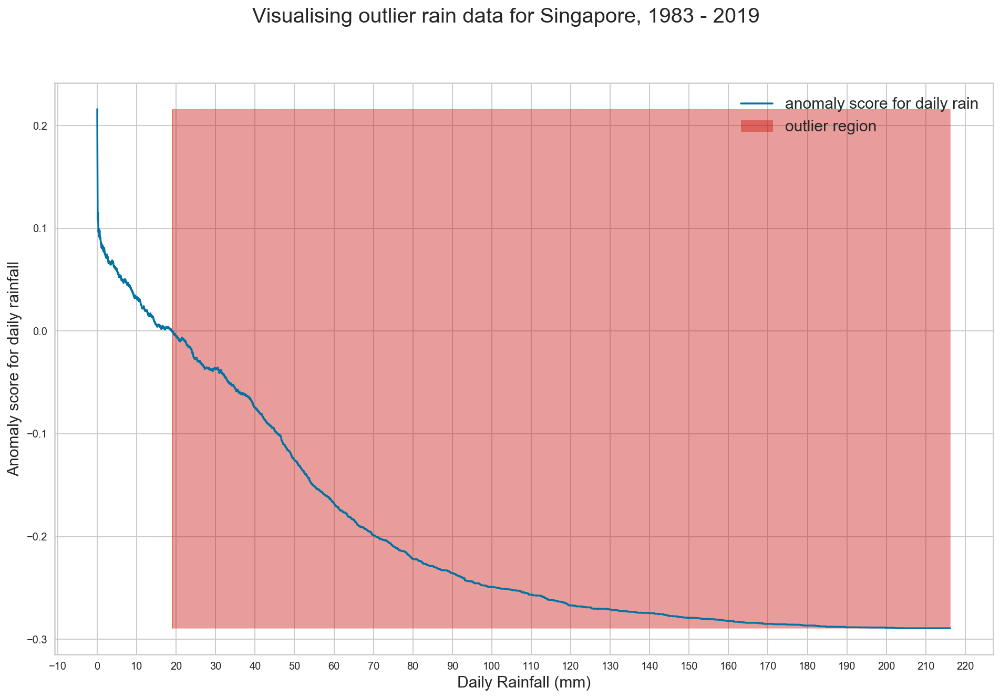

In [292]:
plt.figure(figsize=(16, 10))
plt.plot(rain, anomaly_score_rain, label="anomaly score for daily rain")
plt.fill_between(
    rain.T[0],
    np.min(anomaly_score_rain),
    np.max(anomaly_score_rain),
    where=outlier_rain == -1,
    color="r",
    alpha=0.4,
    label="outlier region",
)
plt.legend(fontsize=15)
plt.ylabel("Anomaly score for daily rainfall", fontsize=15)
plt.xlabel("Daily Rainfall (mm)", fontsize=15)
ax = plt.axes()
ax.xaxis.set_major_locator(plt.MultipleLocator(10))

plt.suptitle("Visualising outlier rain data for Singapore, 1983 - 2019 ", fontsize=20)
plt.show()

From the above graph it is safe to say that the isolation forest classifies the measurement of daily rainfall higher than 20 mm as an outlier. Let us find out where the anomaly score begins with the below code.

In [293]:
idx = np.argwhere(np.diff(np.sign(anomaly_score_rain))).flatten()
rain[idx]

array([[18.87984502],
       [18.8959541 ],
       [18.91206318],
       [19.05704493],
       [19.12148126]])

There are about 1,300 entries which the Isolation Forest consider to be outliers when contamination, or the proportion of outliers, is set to 0.1/10% 

In [294]:
weather[weather["Daily Rainfall Total (mm)"] > 19.4].count()[0]

1300

After this we check the skewness and the kurtosis in the distribution of the daily maximum temperature column

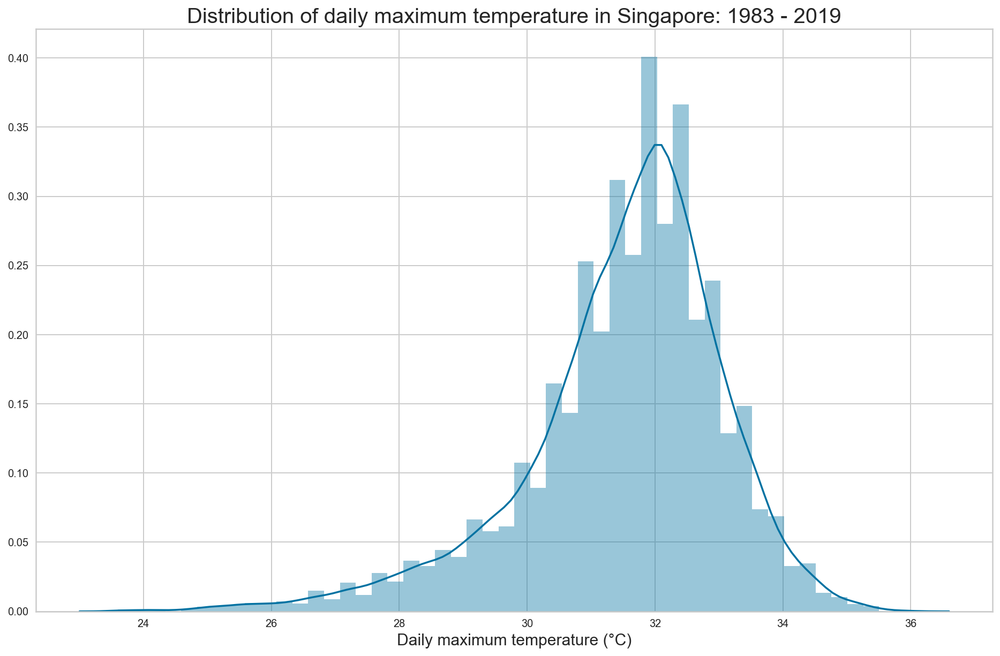

In [296]:
plt.figure(figsize=(16,10))
sns.distplot(weather["Maximum Temperature (°C)"])
plt.title('Distribution of daily maximum temperature in Singapore: 1983 - 2019', fontsize=20)
plt.xlabel("Daily maximum temperature (°C)", fontsize=15)
plt.show()

In [297]:
print("Skewness: %f" % weather["Maximum Temperature (°C)"].skew())
print("Kurtosis: %f" % weather["Maximum Temperature (°C)"].kurt())

Skewness: -1.006573
Kurtosis: 1.884948


The daily maximum temperature column is also highly skewed, negatively this time.

This time we train the IsolationForest model for the data in the Maximum temperature column to see which values it classifies as the outlier in such data

In [298]:
isolation_forest = IsolationForest(
    behaviour="new", n_estimators=500, n_jobs=-1, random_state=42, contamination=0.1
)

isolation_forest.fit(weather["Maximum Temperature (°C)"].values.reshape(-1, 1))

C:\Users\krish\anaconda3\lib\site-packages\sklearn\ensemble\_iforest.py:248: FutureWarning:

'behaviour' is deprecated in 0.22 and will be removed in 0.24. You should not pass or set this parameter.



IsolationForest(behaviour='new', bootstrap=False, contamination=0.1,
                max_features=1.0, max_samples='auto', n_estimators=500,
                n_jobs=-1, random_state=42, verbose=0, warm_start=False)

In [299]:
max_temp = np.linspace(
    weather["Maximum Temperature (°C)"].min(),
    weather["Maximum Temperature (°C)"].max(),
    len(weather),
).reshape(-1, 1)

anomaly_score_maxtemp = isolation_forest.decision_function(max_temp)

outlier_maxtemp = isolation_forest.predict(max_temp)

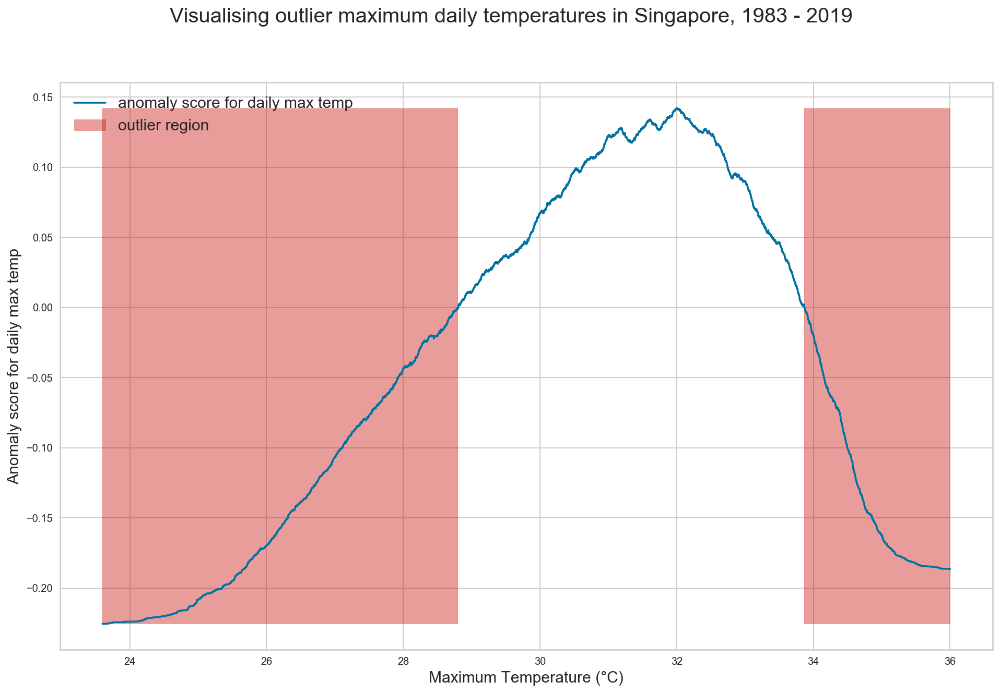

In [300]:
plt.figure(figsize=(16,10))
plt.plot(max_temp, anomaly_score_maxtemp, label='anomaly score for daily max temp')
plt.fill_between(max_temp.T[0], np.min(anomaly_score_maxtemp), np.max(anomaly_score_maxtemp), 
                 where=outlier_maxtemp==-1, color='r', 
                 alpha=.4, label='outlier region')
plt.legend(fontsize=15)
plt.ylabel('Anomaly score for daily max temp', fontsize=15)
plt.xlabel('Maximum Temperature (°C)', fontsize=15)

plt.suptitle("Visualising outlier maximum daily temperatures in Singapore, 1983 - 2019", fontsize=20)
plt.show()

The graph above shows that the IsolationForest model classifies all the temperature below 28.5 degrees celsius and the temperature above 33.8 degrees celsius as the outlier. 
Lets see how many such entries exist in the data we have.

In [91]:
weather[(weather['Maximum Temperature (°C)'] < 28.5) | (weather['Maximum Temperature (°C)'] >= 33.8)].count()[0]

1233

However, Univariate analysis can only get us thus far. We may realize that some of these anomalies that determined by our models are not the anomalies we expected. When our data is multidimensional as opposed to univariate, the approaches to anomaly detection become more computationally intensive and more mathematically complex.

From the univariate analysis with the isolation forest model, we see that it classifies more than a 1000 entries for both the maximum temperature and daily rainfall total data as outliers. Removing so many of the entries would prove to be counterproductive so now we try the multivariate analysis for the outlier detection

### Multivariate Anomaly detection

Most of the analysis that we end up doing are multivariate due to complexity of the world we are living in. In multivariate anomaly detection, outlier is a combined unusual score on at least two variables.

As we took the Daily total rainfall and Maximum temperature for our univariate anomaly detection, we take the same 2 variables for the multivariate anomaly detection too and also because these two are the variables that contribute to more abnormal weather. 

In [92]:
cols = ['Daily Rainfall Total (mm)', 'Maximum Temperature (°C)']
minmax = MinMaxScaler(feature_range=(0, 1))
weather[cols] = minmax.fit_transform(weather[cols])
weather[cols].head()

,Daily Rainfall Total (mm),Maximum Temperature (°C)
0,0.006475,0.620968
1,0.000000,0.782258
2,0.000000,0.862903
3,0.000000,0.846774
4,0.000000,0.798387


In [93]:
X1 = weather['Maximum Temperature (°C)'].values.reshape(-1,1)
X2 = weather['Daily Rainfall Total (mm)'].values.reshape(-1,1)

X = np.concatenate((X1,X2), axis=1)

PyOD conveniently provides us with 4 different algorithms for anomaly detection and they are :-



Cluster-based Local Outlier Factor (CBLOF)  
The CBLOF calculates the outlier score based on cluster-based local outlier factor. An anomaly score is computed by the distance of each instance to its cluster center multiplied by the instances belonging to its cluster. PyOD library includes the CBLOF implementation.   
Scaling the two variables between zero and one.  
Arbitrarily set outliers fraction as 1% based on trial and best guess.  
Fit the data to the CBLOF model and predict the results.  
Use threshold value to consider a data point is inlier or outlier.  
Use decision function to calculate the anomaly score for every point.  


Histogram-based Outlier Detection (HBOS)   
HBOS assumes the feature independence and calculates the degree of anomalies by building histograms. In multivariate anomaly detection, a histogram for each single feature can be computed, scored individually and combined at the end. When using PyOD library, the code are very similar with the CBLOF.


Isolation Forest   
Isolation Forest is similar in principle to Random Forest and is built on the basis of decision trees. Isolation Forest isolates observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of that selected feature.
The PyOD Isolation Forest module is a wrapper of Scikit-learn Isolation Forest with more functionalities.


K - Nearest Neighbors (KNN)   
KNN is one of the simplest methods in anomaly detection. For a data point, its distance to its kth nearest neighbor could be viewed as the outlier score.



We try all of these algorithms together

In [94]:

outliers_fraction = 0.04
classifiers = {
    "Cluster-based Local Outlier Factor (CBLOF)": CBLOF(
        contamination=outliers_fraction, check_estimator=False, random_state=42
    ),
    "Histogram-base Outlier Detection (HBOS)": HBOS(contamination=outliers_fraction),
    "Isolation Forest": IForest(
        contamination=outliers_fraction, random_state=42, behaviour="new"
    ),
    "K Nearest Neighbors (KNN)": KNN(contamination=outliers_fraction),
}

OUTLIERS: 536 | INLIERS: 12886 | MODEL: Cluster-based Local Outlier Factor (CBLOF)


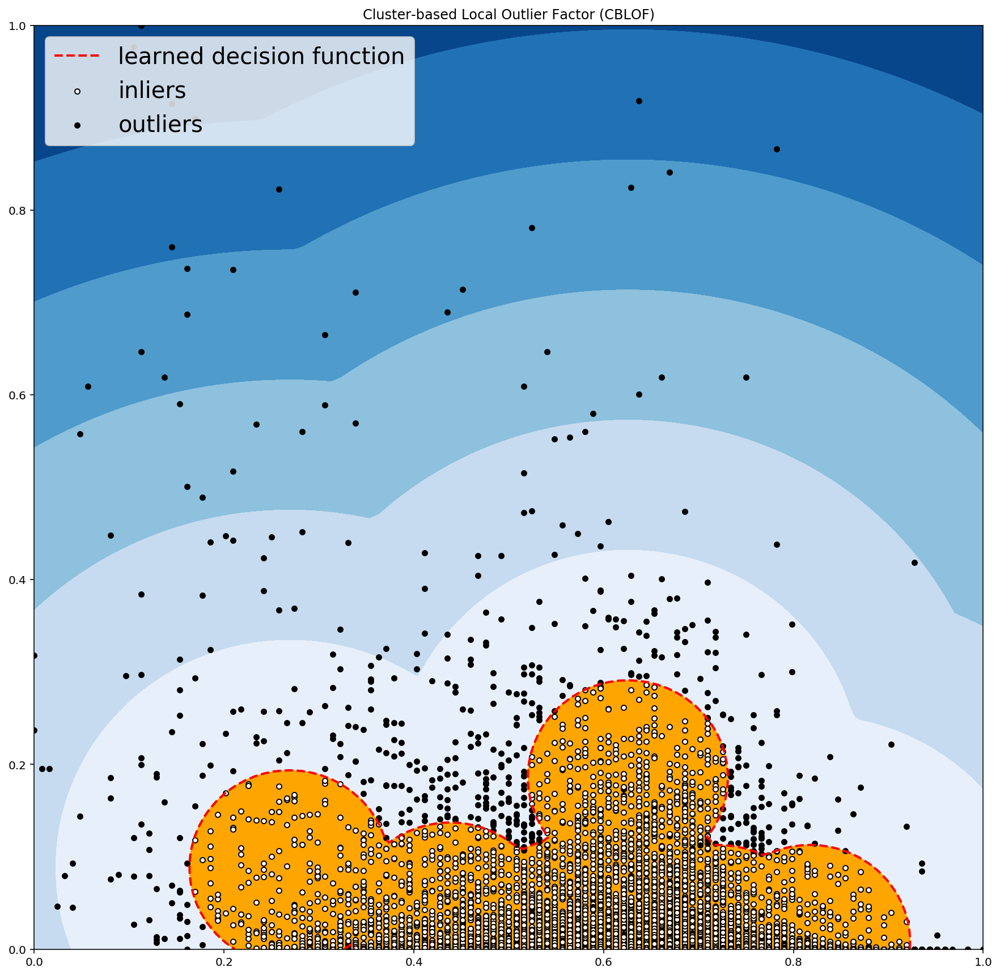

OUTLIERS: 526 | INLIERS: 12896 | MODEL: Histogram-base Outlier Detection (HBOS)


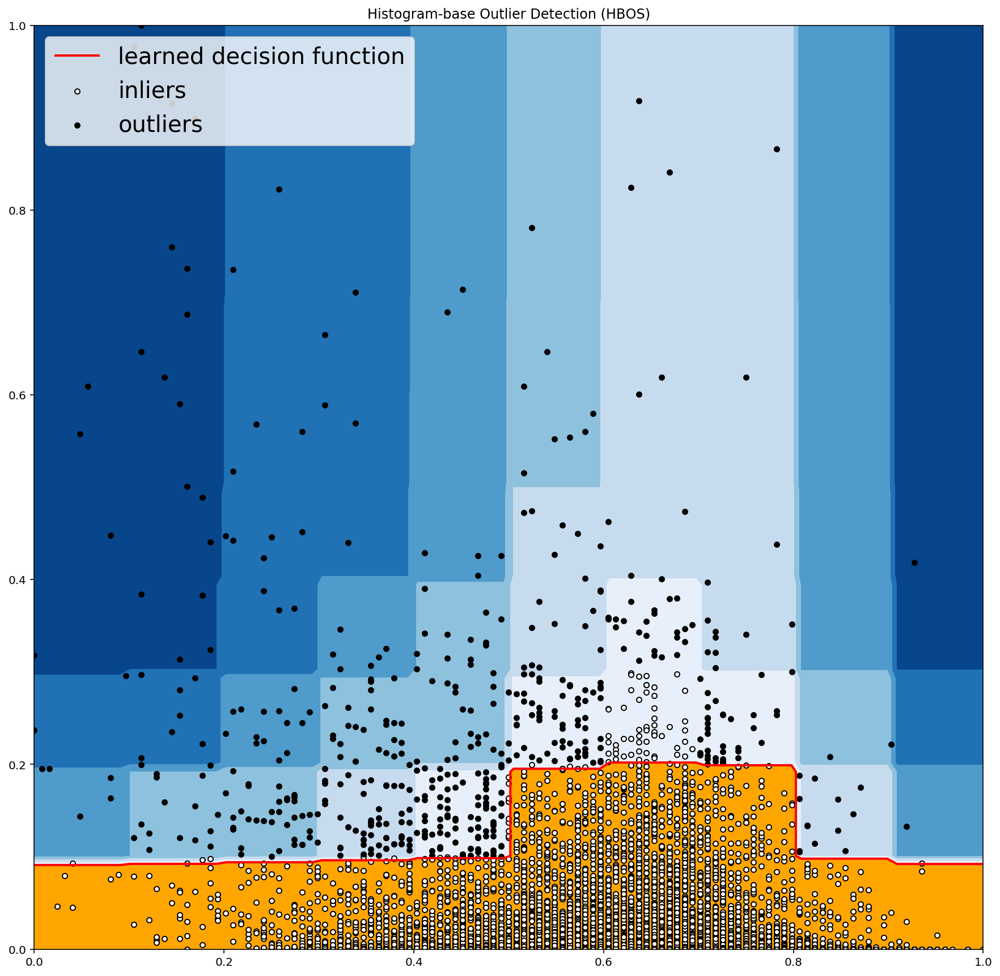

OUTLIERS: 537 | INLIERS: 12885 | MODEL: Isolation Forest


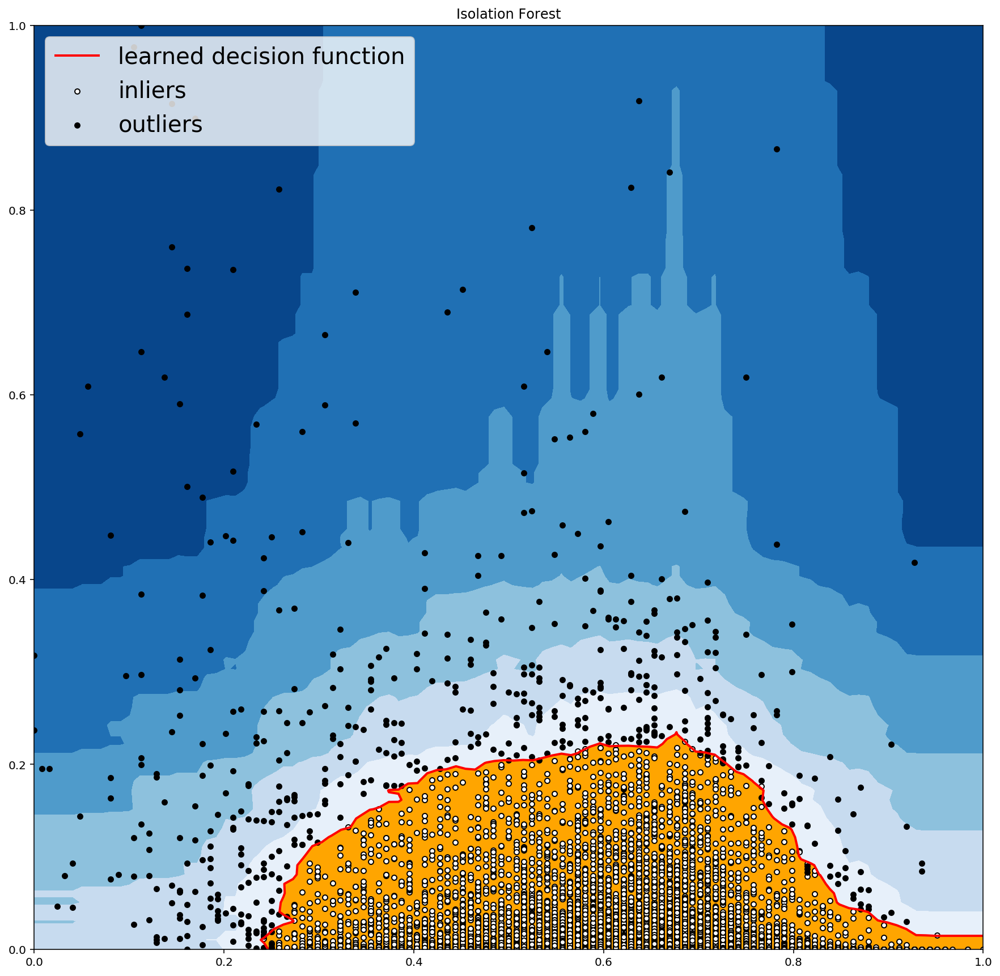

OUTLIERS: 455 | INLIERS: 12967 | MODEL: K Nearest Neighbors (KNN)


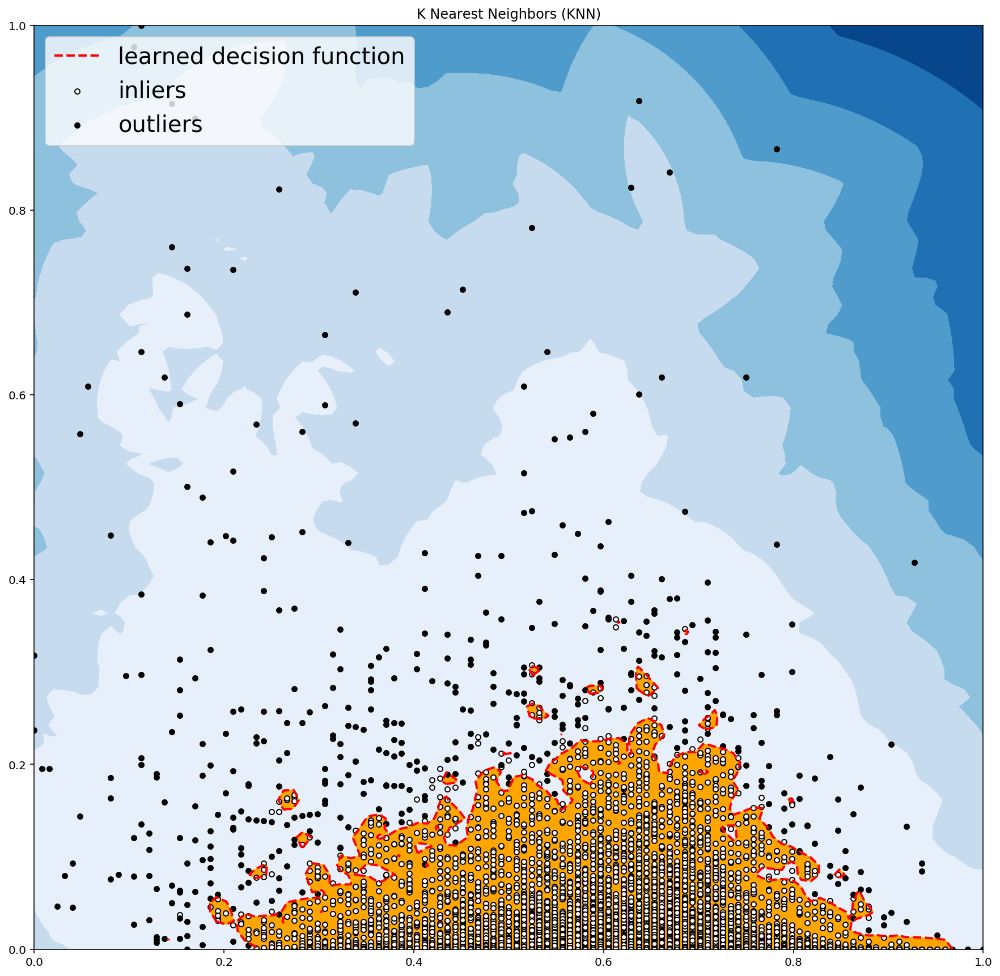

In [95]:
xx , yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
outliers = []

for i, (clf_name, clf) in enumerate(classifiers.items()):
    clf.fit(X)
    
    # predict raw anomaly score
    scores_pred = clf.decision_function(X) * -1
        
    # prediction of a datapoint category outlier or inlier
    y_pred = clf.predict(X)
    n_inliers = len(y_pred) - np.count_nonzero(y_pred)
    n_outliers = np.count_nonzero(y_pred == 1)
    plt.figure(figsize=(15, 15))
    
    # copy of dataframe
    df = weather.copy()
    df['outlier'] = y_pred.tolist()
    
    # creating a combined dataframe of outliers from the 4 models
    outliers.append(df.loc[df['outlier'] == 1])
    outliers_df = pd.concat(outliers) 
    
    # IN1 - inlier feature 1,  IN2 - inlier feature 2
    IN1 =  np.array(df['Maximum Temperature (°C)'][df['outlier'] == 0]).reshape(-1,1)
    IN2 =  np.array(df['Daily Rainfall Total (mm)'][df['outlier'] == 0]).reshape(-1,1)
     
    
    # OUT1 - outlier feature 1, OUT2 - outlier feature 2
    OUT1 =  df['Maximum Temperature (°C)'][df['outlier'] == 1].values.reshape(-1,1)
    OUT2 =  df['Daily Rainfall Total (mm)'][df['outlier'] == 1].values.reshape(-1,1)
         
    print('OUTLIERS:',n_outliers, '|', 'INLIERS:',n_inliers, '|', 'MODEL:',clf_name)
        
    # threshold value to consider a datapoint inlier or outlier
    threshold = stats.scoreatpercentile(scores_pred,100 * outliers_fraction)
        
    # decision function calculates the raw anomaly score for every point
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
    Z = Z.reshape(xx.shape)
          
    # fill blue map colormap from minimum anomaly score to threshold value
    plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
        
    # draw red contour line where anomaly score is equal to thresold
    a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
        
    # fill orange contour lines where range of anomaly score is from threshold to maximum anomaly score
    plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
           
    b = plt.scatter(IN1,IN2, c='white',s=20, edgecolor='k')
    
    c = plt.scatter(OUT1,OUT2, c='black',s=20, edgecolor='k')
       
    plt.axis('tight')  
    
    # loc=2 is used for the top left corner 
    plt.legend(
        [a.collections[0], b,c],
        ['learned decision function', 'inliers','outliers'],
        prop=mpl.font_manager.FontProperties(size=20),
        loc=2)
      
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.title(clf_name)
    plt.show()

The results of the outlier detection were not very different. All of the algorithms showed that close to 500 points are the outliers and thus we analyze these results further to gain more insight into how these algorithms classified the data and also if the anomalies detected are actually anomalies or not

In [96]:
outlier_dates = outliers_df['Date'].unique()
outlier_dates = np.sort(outlier_dates)[::-1]

We re-call the weather dataset again with a new name so that original values are available for visualisation when the outliers are extracted in following cell

In [302]:
raw = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\Data/weather.csv')

In [303]:
abnormal_weather = raw[raw.Date.isin(outlier_dates)]

In [304]:
abnormal_weather.head()

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
143,2019-05-10,2019,5,May,2,10,5.6,29.5,34.7,24.3,6.5,43.9
157,2019-04-26,2019,4,April,2,26,52.4,26.3,29.9,24.0,4.7,28.4
186,2019-03-28,2019,3,March,1,28,29.0,27.9,33.7,22.9,8.6,34.9
203,2019-03-11,2019,3,March,1,11,25.8,27.4,33.0,22.3,7.9,41.0
255,2019-01-18,2019,1,January,1,18,38.2,25.8,28.4,23.5,8.6,31.7


In [305]:
abnormal_weather.describe()

,Year,Month,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
count,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000
mean,1999.993961,6.696860,2.541063,14.858696,43.460749,26.278261,29.635024,23.644203,5.870345,36.586541
std,10.436019,3.974665,1.226276,8.844790,32.864799,1.521720,2.820144,1.123241,2.856066,9.854293
min,1983.000000,1.000000,1.000000,1.000000,0.000000,22.800000,23.600000,21.000000,0.800000,15.800000
25%,1991.000000,3.000000,1.000000,7.000000,24.500000,25.275000,27.400000,23.000000,3.800000,29.500000
50%,2000.000000,7.000000,3.000000,14.000000,37.350000,26.100000,29.600000,23.500000,5.600000,35.600000
75%,2008.250000,11.000000,4.000000,22.250000,55.700000,27.125000,31.700000,24.100000,7.300000,41.800000
max,2019.000000,12.000000,4.000000,31.000000,216.200000,30.700000,36.000000,28.400000,18.400000,86.000000


In [306]:
abnormal_weather.shape

(828, 12)

In all, the PyOD models picked out 828 unique outliers out of a total of 13,330 data points, or about 6% of the dataset.
Now lets take a closer look at these outliers.

In [307]:
abnormal_weather.groupby(['Year']).Month.value_counts().sort_values(ascending=False).head(20)

Year  Month
1983  4        11
      12        9
1991  12        9
1987  1         9
1998  3         8
1992  12        8
2006  12        8
2010  3         8
2018  1         7
1986  1         7
1998  12        7
2008  3         7
2007  1         7
2006  1         6
2001  1         6
2014  12        6
1995  2         6
1986  12        6
2013  2         6
1995  12        6
Name: Month, dtype: int64

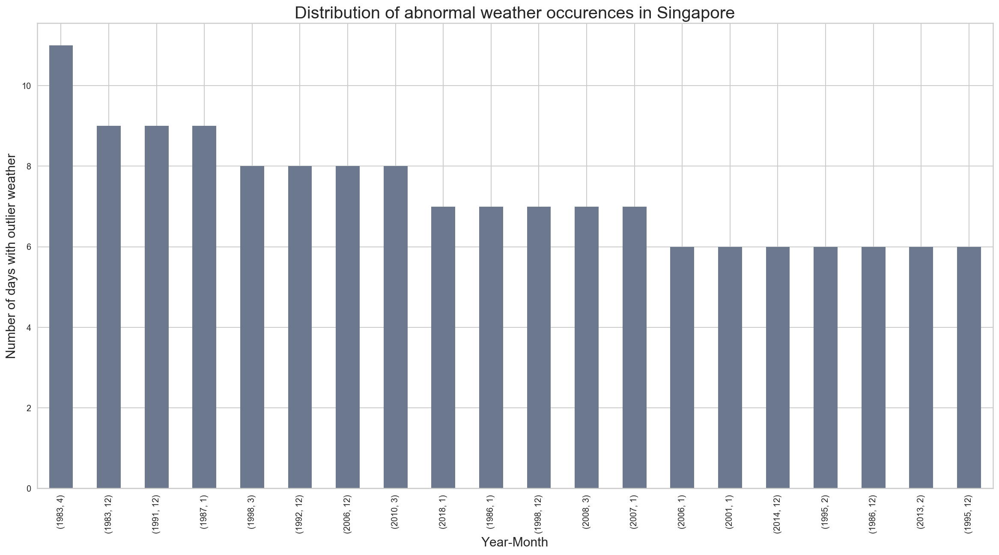

In [308]:
abnormal_weather.groupby(["Year"]).Month.value_counts().sort_values(
    ascending=False
).head(20).plot(kind="bar", 
                figsize=(20, 10),
               color='#6B788D')
plt.title(
    "Distribution of abnormal weather occurences in Singapore",
    fontsize=20,
)
plt.xlabel("Year-Month", fontsize=15)
plt.ylabel("Number of days with outlier weather", fontsize=15)
plt.show()

From the graph above we can see that the April of 1983 had the highest amount of abnormal weather patterns, followed closely by the December of 1983, December of 1991 nd the January of 1987

We take these years and try to analyze them further

In [104]:
crit1 = abnormal_weather['Year'] == 2010
crit2 = abnormal_weather['Month'] == 3
crit3 = abnormal_weather['Year'] == 1991
crit4 = abnormal_weather['Month'] == 12
crit5 = abnormal_weather['Year'] == 1987
crit6 = abnormal_weather['Month'] == 1

march2010 = abnormal_weather[crit1 & crit2]
dec1991 = abnormal_weather[crit3 & crit4]
jan1987 = abnormal_weather[crit5 & crit6]

In [105]:
march2010

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h)
3470,2010-03-31,2010,3,March,1,31,49.1,27.5,32.3,24.1,6.6,32.8
3478,2010-03-23,2010,3,March,1,23,57.6,27.6,30.1,23.6,7.3,25.6
3481,2010-03-20,2010,3,March,1,20,15.5,25.2,25.9,23.6,7.5,25.6
3492,2010-03-09,2010,3,March,1,9,28.7,29.8,35.0,26.7,9.3,32.0
3494,2010-03-07,2010,3,March,1,7,0.0,29.7,35.2,25.9,11.9,41.4
3495,2010-03-06,2010,3,March,1,6,0.0,29.4,35.5,25.2,11.5,40.7
3497,2010-03-04,2010,3,March,1,4,0.0,29.4,35.4,25.4,12.3,33.8
3498,2010-03-03,2010,3,March,1,3,0.0,29.6,35.4,26.0,11.9,34.2


Again we use plotly express here to draw up our graphs here. The bigger and the darker the scatter dot, the more unusual the weather is.

In [309]:
fig = px.scatter(
    abnormal_weather.query("Year==2010").query("Month==3"),
    x="Day",
    y="Maximum Temperature (°C)",
    color="Max Wind Speed (km/h)",
    size="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of weather outliers in Singapore - March 2010"
    )
)
fig.show()

In [310]:
fig = px.scatter(
    abnormal_weather.query("Year==1987").query("Month==1"),
    x="Day",
    y="Maximum Temperature (°C)",
    color="Max Wind Speed (km/h)",
    size="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    color_continuous_scale=px.colors.cyclical.IceFire,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of weather outliers in Singapore - January 1987"
    )
)
fig.show()

Next, we tried to break down the data by the year and see how many abnormal weather events happened in each year

In [311]:
abnormal_weather['Year'].value_counts().sort_values(ascending=False).head(20)

1998    40
1983    38
2007    30
2008    29
1986    29
2006    29
1988    28
2013    28
1984    28
2010    27
2001    26
1995    24
2011    24
1987    24
2003    23
2000    23
1993    23
2004    23
2016    22
2002    22
Name: Year, dtype: int64

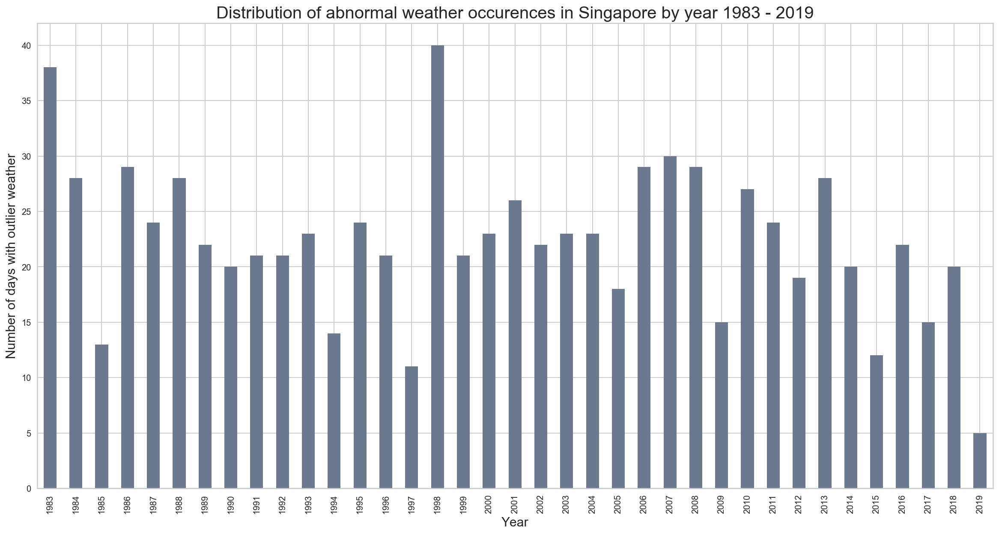

In [312]:
abnormal_weather["Year"].value_counts().sort_index(ascending=True).plot(
    kind="bar", 
    figsize=(20, 10),
    color='#6B788D'
)
plt.title(
    "Distribution of abnormal weather occurences in Singapore by year 1983 - 2019",
    fontsize=20,
)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Number of days with outlier weather", fontsize=15)
plt.show()

It is clear from the graph above that the year of 1998 had the higher amount of abnormal weather events followed closely by 1983 and then 2007. 

Next we break down the amount of abnormal occurences by the months they occur in

In [313]:
abnormal_weather['Month'].value_counts().sort_values(ascending=False)

12    148
1     117
3      89
11     82
4      61
5      58
9      57
7      52
8      42
10     42
2      41
6      39
Name: Month, dtype: int64

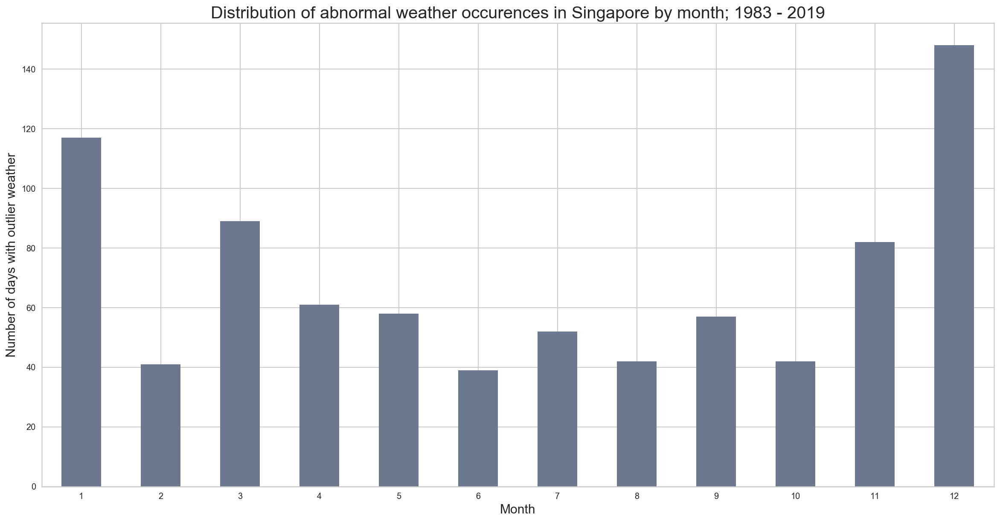

In [314]:
abnormal_weather["Month"].value_counts().sort_index(ascending=True).plot(
    kind="bar", 
    figsize=(20, 10),
    color='#6B788D'
)
plt.title(
    "Distribution of abnormal weather occurences in Singapore by month; 1983 - 2019",
    fontsize=20,
)
plt.xlabel("Month", fontsize=15)
plt.ylabel("Number of days with outlier weather", fontsize=15)
plt.xticks(rotation=0)
plt.show()


It is clear from the above graph that there are highest abnormal weather events in December. Seems like that is a bad time to visit Singapore speaking purely from a climate perspective and then followed by January.


Since we see such abnormal weather patterns over the year, it is imperative that we plot them to see how they visualize. Again we use plotly express for this - the bigger or darker the dot is, the more abnormal the weather pattern is. We plot the 3 years that have the highest amount of abnormal weather occurences - 1998, 1983 and 2007

In [315]:
fig = px.scatter(
    abnormal_weather.query("Year==1998"),
    x="Day",
    y="Maximum Temperature (°C)",
    color="Max Wind Speed (km/h)",
    size="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.sequential.deep,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of weather outliers in Singapore - 1998"
    )
)
fig.show()

At a glance we can see that this year surely has a weird data in it compared to the others. It is also interesting to see that almost all the months have some or  other abnormal weather pattern except for february. That was calm for some reason

In [316]:
fig = px.scatter(
    abnormal_weather.query("Year==1983"),
    x="Day",
    y="Maximum Temperature (°C)",
    color="Max Wind Speed (km/h)",
    size="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.sequential.deep,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of weather outliers in Singapore - 1983"
    )
)
fig.show()

In [317]:
fig = px.scatter(
    abnormal_weather.query("Year==2007"),
    x="Day",
    y="Maximum Temperature (°C)",
    color="Max Wind Speed (km/h)",
    size="Daily Rainfall Total (mm)",
    size_max = 30,
    hover_name="Date",
    facet_col="Month",
    color_continuous_scale=px.colors.sequential.deep,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of weather outliers in Singapore - 2007"
    )
)
fig.show()

There are some outliers in the data that are the outliers among the outliers so we plot them on a scatter plot to analyze them further. 
The colors indicate the years and the size of the dots indicate the daily total rainfall(mm).
As always we also make a plotly express graph to make it more interactive

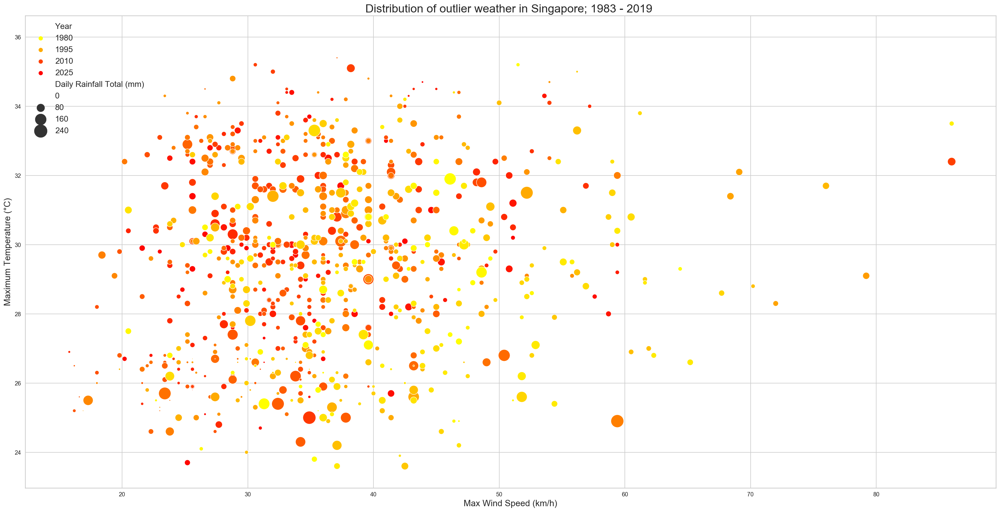

In [318]:
plt.figure(figsize=(30, 15))
sns.scatterplot(
    x="Max Wind Speed (km/h)",
    y="Maximum Temperature (°C)",
    data=abnormal_weather,
    marker="o",
    sizes=(0, 500),
    size="Daily Rainfall Total (mm)",
    hue="Year",
    palette="autumn_r",
)
plt.title("Distribution of outlier weather in Singapore; 1983 - 2019 ", fontsize=20)
plt.xlabel("Max Wind Speed (km/h)", fontsize=15)
plt.ylabel("Maximum Temperature (°C)", fontsize=15)
plt.legend(prop={'size':14})
plt.show()

In [319]:
fig = px.scatter(
    abnormal_weather,
    x="Max Wind Speed (km/h)",
    y="Maximum Temperature (°C)",
    color="Year",
    size="Daily Rainfall Total (mm)",
    hover_name="Date",
    size_max=25,
    color_continuous_scale=px.colors.sequential.YlOrRd,
)
fig.update_layout(
    title=go.layout.Title(
        text="Distribution of outlier weather in Singapore; 1983 - 2019"
    ),
    autosize=False,
    width=2200,
    height=900
)
fig.show()

## Predicting Rainfall

In most machine learning projects the data that you have to work with is unlikely to be in the ideal format for producing the best performing model. There are quite often a number of transformational steps such as encoding categorical variables, feature scaling and normalisation that need to be performed. Scikit-learn has built in functions for most of these commonly used transformations in it’s preprocessing package.

However, in a typical machine learning workflow there is a need to apply all these transformations at least twice. Once when training the model and again on any new data you want to predict on. Of course you could write a function to apply them and reuse that but you would still need to run this first and then call the model separately. Scikit-learn pipelines are a tool to simplify this process. They have several key benefits:
They make your workflow much easier to read and understand.
They enforce the implementation and order of steps in your project.
These in turn make your work much more reproducible.


Here I will implement a classification algorithm to classify and predict whether a particular day is rainy or not. Here I have implemented two different models with the pipeline which are the logistic regression and the XGBoost model. These two models were chosen to illustrate a key consideration in machine learning which is the time and resource trade off. More complex model would require higher computation power and more time both of which are in scarcity.

With the below code, we add another column in the weather data called the 'Rain_Or_Not' which indicates if it has rained or not on that particular day   
If it has rained then Rain_Or_Not = 1  
If it hasn't then Rain_Or_Not = 0    
This will be our target column.

In [353]:
weather['Rain_Or_Not'] = np.where(weather['Daily Rainfall Total (mm)'] > 0, 1, 0)

In [354]:
weather['Rain_Or_Not'].value_counts()

0    7005
1    6417
Name: Rain_Or_Not, dtype: int64

In [355]:
weather.head(5)

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h),Rain_Or_Not
0,2019-09-30,2019,9,September,3,30,1.4,27.5,31.3,25.1,6.8,34.2,1
1,2019-09-29,2019,9,September,3,29,0.0,28.4,33.3,26.5,6.8,41.4,0
2,2019-09-28,2019,9,September,3,28,0.0,28.9,34.3,26.0,7.6,29.5,0
3,2019-09-27,2019,9,September,3,27,0.0,29.2,34.1,26.8,9.7,30.6,0
4,2019-09-26,2019,9,September,3,26,0.0,28.5,33.5,25.4,9.0,31.0,0


The first step in building the pipeline is to define each transformer type. The convention here is generally to create transformers for the different variable types. In the code below I have created a numeric transformer which applies a StandardScaler    
Next we use the ColumnTransformer to apply the transformations to the correct columns in the dataframe. Before building this I have stored lists of the numeric and categorical columns using the pandas dtype method.

In [123]:
numeric_features = [
        "Mean Temperature (°C)",
        "Maximum Temperature (°C)",
        "Minimum Temperature (°C)",
        "Mean Wind Speed (km/h)",
        "Max Wind Speed (km/h)",
]

numeric_transformer = Pipeline(
    steps=[("scaler", StandardScaler())]
)

preprocessor = ColumnTransformer(
    transformers=[("num", numeric_transformer, numeric_features)]
)


In the below code, we just divide the variables into which ones are the target variables and which ones are not. Here the Rain_Or_Not column is the target variable as we can see

In [124]:
X = weather[
    [
        "Mean Temperature (°C)",
        "Maximum Temperature (°C)",
        "Minimum Temperature (°C)",
        "Mean Wind Speed (km/h)",
        "Max Wind Speed (km/h)",
    ]
]

y = weather["Rain_Or_Not"]

Dividing the data into train and test sets and we can see the size of the datasets with the code below

In [125]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2, stratify=y)

In [126]:
print(X_train.shape)
print(X_test.shape)

(10737, 5)
(2685, 5)


In [127]:
print(y_train.shape)
print(y_test.shape)

(10737,)
(2685,)


A baseline model helps us gauge what's the minimum level of accuracy the model must achieve in order to be acceptable. In this case, it is about 0.5, which makes sense, ie, there's an equal chance a random guess would be accurate in telling us whether it would rain or not in Singapore.

In [128]:
dummy = DummyClassifier(strategy='stratified', random_state=42)

In [129]:
dummy.fit(X_train, y_train)
dummy_pred = dummy.predict(X_test)
print("Accuracy Score:", accuracy_score(y_test, dummy_pred))

Accuracy Score: 0.49422718808193666


We can fit as many competing models in this pipeline as we wish. It is common for up to a dozen or more models to be tested in the exploration phase. However we have to take into account the resource and time tradeoff. Since we have also used a gridsearch process, it takes more time and the entire process took more than 9 hours to give results. There are also less number of hyperparameters used and we can certainly add more if the time and resources permit for it as it would exponentially increase the time required for the grid search process.

In [130]:
models = {
    "LogReg": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                (
                    "clf",
                    LogisticRegression(
                        penalty="l2",
                        class_weight="balanced",
                        random_state=42,
                        verbose=1,
                        n_jobs=-1,
                    ),
                ),
            ]
        ),
        {
            "clf__penalty": ["l2"],
            "clf__C": np.logspace(1, 5, 10),
            "clf__solver": ["liblinear", "newton-cg", "sag", "saga", "lbfgs"],
            "clf__max_iter": [100, 500, 1000, 1500],
        },
    ),
    "XGB": (
        Pipeline(
            steps=[
                ("preprocessor", preprocessor),
                (
                    "clf",
                    XGBClassifier(
                        base_score=0.5,
                        objective="binary:logistic",
                        reg_lambda=0.1,
                        n_estimators=1000,
                        max_delta_step=0,
                        scale_pos_weight=1,
                        subsample=0.5,
                        random_state=42,
                        n_jobs=-1,
                        verbosity=1,
                    ),
                ),
            ]
        ),
        {
            "clf__gamma": [i / 10.0 for i in range(1, 10)],
            "clf__reg_alpha": [1e-5, 1e-2, 0.1, 1, 10],
            "clf__learning_rate": [0.01, 0.05, 0.1],
            "clf__min_child_weight": [i for i in range(2, 10)],
            "clf__max_depth": [10, 15, 20]
        },
    ),
}


In [131]:
for name, (model, parameters) in models.items():
    print("----- {} -----".format(name))

    gs = GridSearchCV(
        model,
        parameters,
        cv=5,
        n_jobs=-1,
        scoring="roc_auc",
        verbose=1,
        return_train_score=True,
    )

    gs.fit(X_train, y_train)
    print("Best Parameters:", gs.best_params_)
    print("")
    print("Best Score:", gs.best_score_)

    joblib.dump(gs.best_estimator_, f"{name}.pkl", compress=1)
    joblib.dump(gs.cv_results_, f"{name}_results.pkl", compress=1)

    y_pred = gs.predict(X_test)

    print("")
    print("Precision Score :", precision_score(y_test, y_pred))
    print("Recall Score:", recall_score(y_test, y_pred))
    print("f1 Score:", f1_score(y_test, y_pred))
    print("")

----- LogReg -----
Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:   15.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished


Best Parameters: {'clf__C': 27.825594022071243, 'clf__max_iter': 100, 'clf__penalty': 'l2', 'clf__solver': 'newton-cg'}

Best Score: 0.8039401303610363

Precision Score : 0.7005988023952096
Recall Score: 0.7289719626168224
f1 Score: 0.7145038167938931

----- XGB -----
Fitting 5 folds for each of 3240 candidates, totalling 16200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 33.8min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 51.0min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed: 70.2min
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed: 95.8min
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed: 121.3min
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed: 150.9min
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed: 182.0min
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed: 217.0min
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed: 252.7min
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed: 293.9min
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed: 336.6min
[Parallel(n_jobs=-1)]: Done 11226 task

Best Parameters: {'clf__gamma': 0.7, 'clf__learning_rate': 0.01, 'clf__max_depth': 20, 'clf__min_child_weight': 6, 'clf__reg_alpha': 10}

Best Score: 0.8203393695282987

Precision Score : 0.741447891805887
Recall Score: 0.7258566978193146
f1 Score: 0.7335694608421881



From the above code we can see that the XGB Classifier scored better so I use that model further to predict whether or not it will rain. However we can clearly see that the Logistic Regression takes less time to train so that might be preferable if there is less time available.

### XGBoost Model

XGBoost is an implementation of gradient boosted decision trees designed for speed and performance that is dominative competitive machine learning.

In [132]:
XGB = joblib.load("XGB.pkl")

 Showing the finalised model the full training data-set, ahead of testing it on unseen data

In [133]:
XGB.fit(X, y)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('scaler',
                                                                   StandardScaler(copy=True,
                                                                                  with_mean=True,
                                                                                  with_std=True))],
                                                           verbose=False),
                                                  ['Mean Temperature (°C)',
                                                   'Maximum Temperature (°C)',
                                  

There is validation dataset that is available which we preprocess in the same way we preprocessed the weather dataset and add our target column to the dataset and determine the target variable with the code below.

In [134]:
validate = pd.read_csv(r'C:\Users\krish\Desktop\ADS\Project\Data/weather_dec2019.csv')

In [135]:
validate['Rain_Or_Not'] = np.where(validate['Daily Rainfall Total (mm)'] > 0, 1, 0)

In [136]:
X_validate = validate[
    [
        "Mean Temperature (°C)",
        "Maximum Temperature (°C)",
        "Minimum Temperature (°C)",
        "Mean Wind Speed (km/h)",
        "Max Wind Speed (km/h)",
    ]
]

y_validate = validate["Rain_Or_Not"]

In [137]:
y_validate.value_counts()

0    17
1    14
Name: Rain_Or_Not, dtype: int64

Now we generate and assess the predictions by the XGB model

In [138]:
pred = XGB.predict(X_validate)

In [139]:
print("Accuracy Score:", accuracy_score(y_validate, pred))
print("Precision Score :", precision_score(y_validate, pred))
print("Recall Score:", recall_score(y_validate, pred))
print("f1 Score:", f1_score(y_validate, pred))

Accuracy Score: 0.7419354838709677
Precision Score : 0.75
Recall Score: 0.6428571428571429
f1 Score: 0.6923076923076924


In [140]:
cm = confusion_matrix(y_validate, pred)
cm

array([[14,  3],
       [ 5,  9]], dtype=int64)

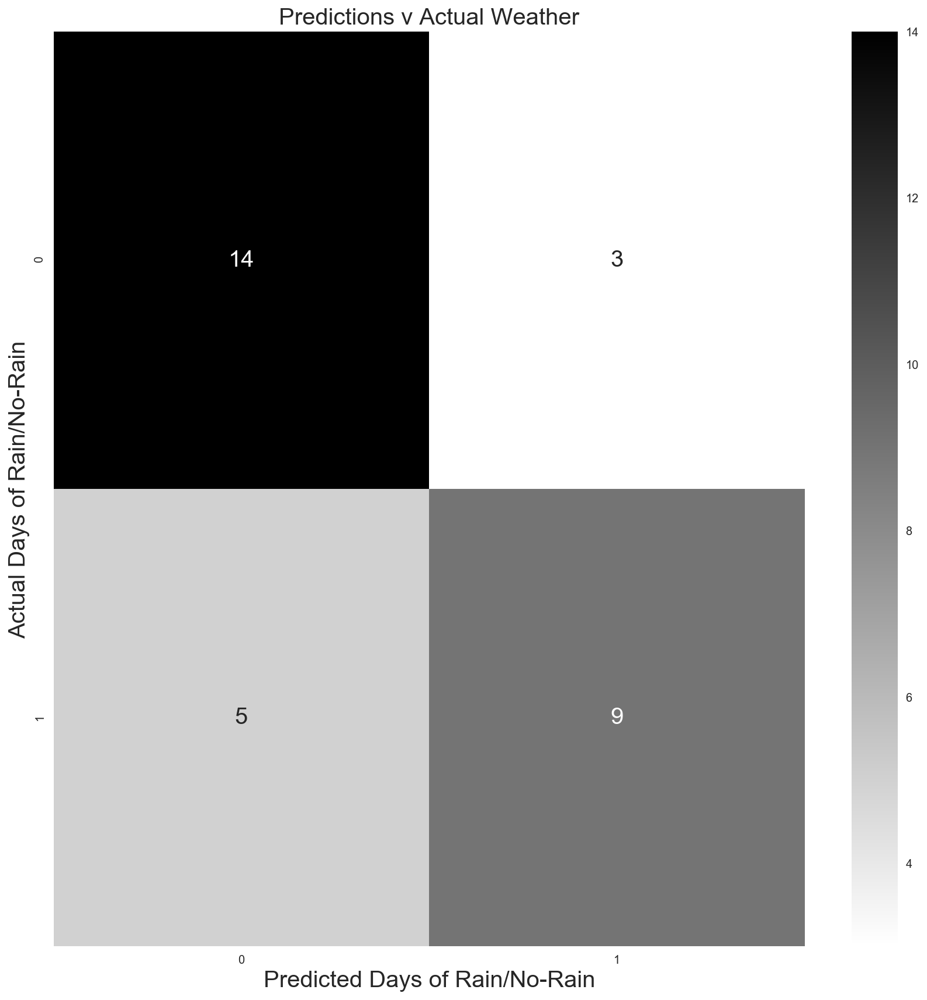

In [141]:
plt.figure(figsize=(12,12))
sns.heatmap(cm, annot=True, fmt="d", cmap="gist_gray_r", annot_kws={"size": 20})
plt.title("Predictions v Actual Weather", fontsize=20)
plt.ylabel("Actual Days of Rain/No-Rain", fontsize=20)
plt.xlabel("Predicted Days of Rain/No-Rain", fontsize=20)
plt.tight_layout()

With the above results we can see that the XGB model correctly classified 23 out of days 31 giving it an accuracy score of 0.75.
The model wrongly predicted that it would rain on 3 days, when they were in fact sunny (false positives). It also wrongly predicted 5 sunny days when it in fact rained on those days (false negatives). The XGB model is weakest in terms of its recall score, in this case meaning its ability to correctly identify rainy days as such (9 out of 14).

### Logistic Regression Model

Logistic Regression is a Machine Learning classification algorithm that is used to predict the probability of a categorical dependent variable. In logistic regression, the dependent variable is a binary variable that contains data coded as 1 (yes, success, etc.) or 0 (no, failure, etc.). In other words, the logistic regression model predicts P(Y=1) as a function of X.

In [525]:
LogReg = joblib.load("LogReg.pkl")

In [526]:
LogReg.fit(X,y)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('scaler',
                                                                   StandardScaler(copy=True,
                                                                                  with_mean=True,
                                                                                  with_std=True))],
                                                           verbose=False),
                                                  ['Mean Temperature (°C)',
                                                   'Maximum Temperature (°C)',
                                  

In [527]:
pred = LogReg.predict(X_validate)

In [528]:
print("Accuracy Score:", accuracy_score(y_validate, pred))
print("Precision Score :", precision_score(y_validate, pred))
print("Recall Score:", recall_score(y_validate, pred))
print("f1 Score:", f1_score(y_validate, pred))

Accuracy Score: 0.8064516129032258
Precision Score : 0.8333333333333334
Recall Score: 0.7142857142857143
f1 Score: 0.7692307692307692


In [529]:
cm = confusion_matrix(y_validate, pred)
cm

array([[15,  2],
       [ 4, 10]], dtype=int64)

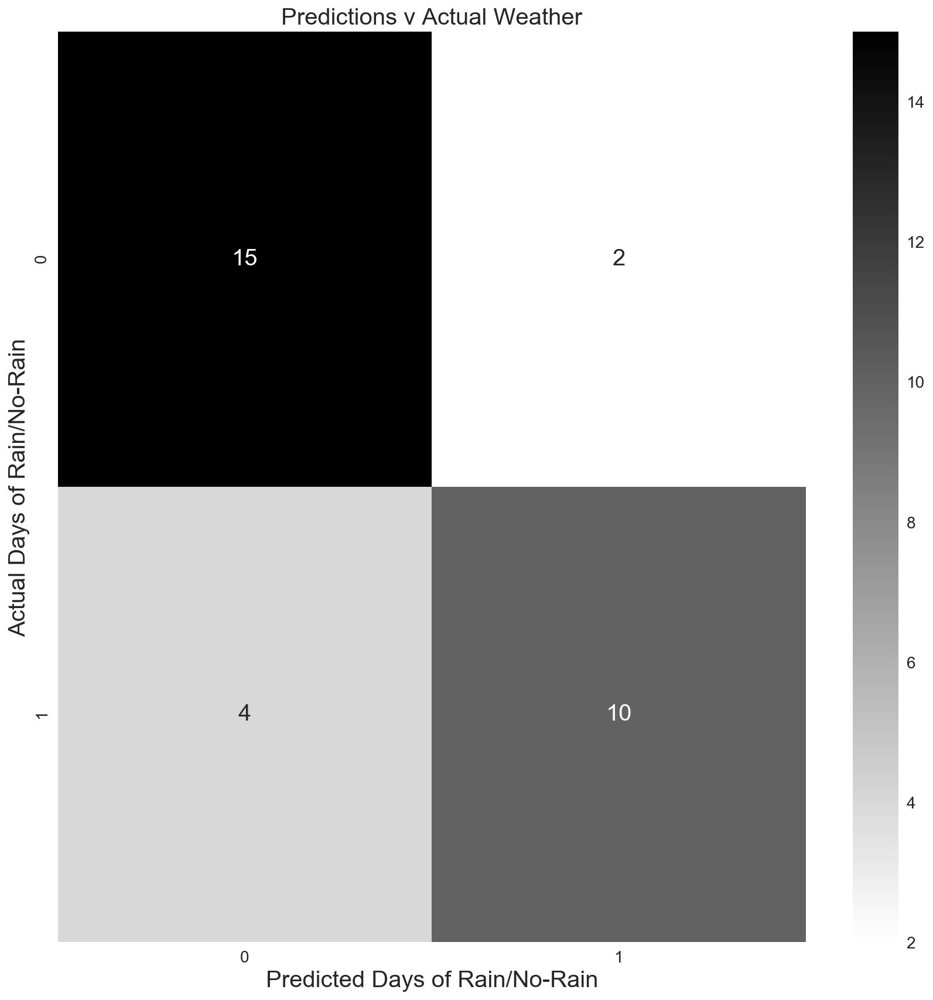

In [530]:
plt.figure(figsize=(12,12))
sns.heatmap(cm, annot=True, fmt="d", cmap="gist_gray_r", annot_kws={"size": 20})
plt.title("Predictions v Actual Weather", fontsize=20)
plt.ylabel("Actual Days of Rain/No-Rain", fontsize=20)
plt.xlabel("Predicted Days of Rain/No-Rain", fontsize=20)
plt.tight_layout()

With the above results we can see that the LogReg model correctly classified 25 out of 31 days giving it an accuracy score of 0.80. The model wrongly predicted that it would rain on 2 days, when they were in fact sunny (false positives). It also wrongly predicted 4 sunny days when it in fact rained on those days (false negatives). The Logistic Regression model is weak in terms of its recall score, in this case meaning its ability to correctly identify rainy days as such (10 out of 14).

## Using Deep Learning to predict the Rainfall

Deep learning (also known as deep structured learning or differential programming) is part of a broader family of machine learning methods based on artificial neural networks with representation learning. Learning can be supervised, semi-supervised or unsupervised. Deep learning architectures such as deep neural networks, deep belief networks, recurrent neural networks and convolutional neural networks have been applied to fields including computer vision, speech recognition, natural language processing, audio recognition, social network filtering, machine translation, bioinformatics, drug design, medical image analysis, material inspection and board game programs, where they have produced results comparable to and in some cases surpassing human expert performance.

After trying out the classic machine learning approach with the XGBoost and Logistic Regression model, I decided to try a few deep learning models to see how it fares on the data that we have. It is not always true that a neural network will necessarily provide better results than one of the classic machine learning models. Infact, that all depends on the data that we have. Here, I have tried to experiment with 2 different deep learning models and analyze the results gleaned from them. 


In [394]:
weather.head(5)

,Date,Year,Month,Month_Name,Quarter,Day,Daily Rainfall Total (mm),Mean Temperature (°C),Maximum Temperature (°C),Minimum Temperature (°C),Mean Wind Speed (km/h),Max Wind Speed (km/h),Rain_Or_Not
0,2019-09-30,2019,9,September,3,30,1.4,27.5,31.3,25.1,6.8,34.2,1
1,2019-09-29,2019,9,September,3,29,0.0,28.4,33.3,26.5,6.8,41.4,0
2,2019-09-28,2019,9,September,3,28,0.0,28.9,34.3,26.0,7.6,29.5,0
3,2019-09-27,2019,9,September,3,27,0.0,29.2,34.1,26.8,9.7,30.6,0
4,2019-09-26,2019,9,September,3,26,0.0,28.5,33.5,25.4,9.0,31.0,0


In [498]:
weather.shape

(13422, 13)

We use LR anenealer here to reduce the learning rate when a metric gas stopped improving. Here we monitor the val_acc values with a patience of 3 which means that the learning rate is reduced after 3 epochs of no improvement. The factor us set to 0.1 si that we increase it by a factor of 0.1

In [453]:
from keras.callbacks import ReduceLROnPlateau
red_lr= ReduceLROnPlateau(monitor='val_acc',patience=3,verbose=1,factor=0.1)

### First Deep Learning model
Then we construct a model for our classification problem. It is a classic approach to use the sigmoid activation function in the last layer when dealing with binary classification. Here we have used 2 more Dense layers with 16 filters and a relu activation function

In [454]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(5,)),
    keras.layers.Dense(16, activation=tf.nn.relu),
    keras.layers.Dense(16, activation=tf.nn.relu),
    keras.layers.Dense(16, activation=tf.nn.sigmoid),
    keras.layers.Dense(1, activation=tf.nn.sigmoid),
])

In [485]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_14 (Flatten)         (None, 5)                 0         
_________________________________________________________________
dense_53 (Dense)             (None, 16)                96        
_________________________________________________________________
dense_54 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_55 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_56 (Dense)             (None, 1)                 17        
Total params: 657
Trainable params: 657
Non-trainable params: 0
_________________________________________________________________


In [455]:
y_test.shape

(2685,)

We use the standard Adam optimizer function and the binary crossentropy function as this is a binary classification problem and in the spirit of going overboard, i set the number of epochs to 1000 to see how much it would help with the loss and accuracy of the problem

In [456]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

History = model.fit(X_train, y_train, validation_data = (X_test,y_test), epochs=1000, batch_size=1)
#test_loss, test_acc = model.evaluate(X_test, y_test)

Train on 10737 samples, validate on 2685 samples
Epoch 1/1000
10737/10737 [==============================] - 10s 893us/sample - loss: 0.6137 - accuracy: 0.6586 - val_loss: 0.6136 - val_accuracy: 0.6547
Epoch 2/1000
10737/10737 [==============================] - 9s 879us/sample - loss: 0.5934 - accuracy: 0.6818 - val_loss: 0.6237 - val_accuracy: 0.6521
Epoch 3/1000
10737/10737 [==============================] - 10s 888us/sample - loss: 0.5911 - accuracy: 0.6864 - val_loss: 0.5872 - val_accuracy: 0.6767
Epoch 4/1000
10737/10737 [==============================] - 10s 906us/sample - loss: 0.5885 - accuracy: 0.6922 - val_loss: 0.5848 - val_accuracy: 0.6942
Epoch 5/1000
10737/10737 [==============================] - 10s 903us/sample - loss: 0.5847 - accuracy: 0.6937 - val_loss: 0.5790 - val_accuracy: 0.6898
Epoch 6/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5810 - accuracy: 0.6943 - val_loss: 0.5922 - val_accuracy: 0.6842
Epoch 7/1000
10737/10737 [=========

10737/10737 [==============================] - 9s 864us/sample - loss: 0.5503 - accuracy: 0.7164 - val_loss: 0.5570 - val_accuracy: 0.7143
Epoch 54/1000
10737/10737 [==============================] - 9s 861us/sample - loss: 0.5499 - accuracy: 0.7231 - val_loss: 0.5588 - val_accuracy: 0.7095
Epoch 55/1000
10737/10737 [==============================] - 9s 856us/sample - loss: 0.5496 - accuracy: 0.7223 - val_loss: 0.5521 - val_accuracy: 0.7166
Epoch 56/1000
10737/10737 [==============================] - 10s 902us/sample - loss: 0.5499 - accuracy: 0.7185 - val_loss: 0.5763 - val_accuracy: 0.7125
Epoch 57/1000
10737/10737 [==============================] - 11s 1ms/sample - loss: 0.5489 - accuracy: 0.7248 - val_loss: 0.5482 - val_accuracy: 0.7181
Epoch 58/1000
10737/10737 [==============================] - 9s 879us/sample - loss: 0.5494 - accuracy: 0.7214 - val_loss: 0.5627 - val_accuracy: 0.6998
Epoch 59/1000
10737/10737 [==============================] - 9s 880us/sample - loss: 0.5498 - ac

10737/10737 [==============================] - 9s 878us/sample - loss: 0.5478 - accuracy: 0.7224 - val_loss: 0.5476 - val_accuracy: 0.7181
Epoch 107/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5477 - accuracy: 0.7263 - val_loss: 0.5473 - val_accuracy: 0.7248racy: 
Epoch 108/1000
10737/10737 [==============================] - 9s 880us/sample - loss: 0.5488 - accuracy: 0.7197 - val_loss: 0.5526 - val_accuracy: 0.7196s: 0.5
Epoch 109/1000
10737/10737 [==============================] - 9s 881us/sample - loss: 0.5472 - accuracy: 0.7238 - val_loss: 0.5483 - val_accuracy: 0.7229
Epoch 110/1000
10737/10737 [==============================] - 9s 882us/sample - loss: 0.5493 - accuracy: 0.7252 - val_loss: 0.5517 - val_accuracy: 0.7188
Epoch 111/1000
10737/10737 [==============================] - 9s 883us/sample - loss: 0.5477 - accuracy: 0.7187 - val_loss: 0.5604 - val_accuracy: 0.7099
Epoch 112/1000
10737/10737 [==============================] - 9s 881us/sample -

10737/10737 [==============================] - 9s 869us/sample - loss: 0.5460 - accuracy: 0.7256 - val_loss: 0.5454 - val_accuracy: 0.7244
Epoch 160/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5487 - accuracy: 0.7221 - val_loss: 0.5502 - val_accuracy: 0.7207
Epoch 161/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5475 - accuracy: 0.7210 - val_loss: 0.5444 - val_accuracy: 0.7251
Epoch 162/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5465 - accuracy: 0.7239 - val_loss: 0.5451 - val_accuracy: 0.7236
Epoch 163/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5470 - accuracy: 0.7239 - val_loss: 0.5515 - val_accuracy: 0.7084
Epoch 164/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5484 - accuracy: 0.7224 - val_loss: 0.5455 - val_accuracy: 0.7240
Epoch 165/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.548

10737/10737 [==============================] - 9s 877us/sample - loss: 0.5467 - accuracy: 0.7244 - val_loss: 0.5522 - val_accuracy: 0.7263
Epoch 213/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5481 - accuracy: 0.7208 - val_loss: 0.5558 - val_accuracy: 0.7076
Epoch 214/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5487 - accuracy: 0.7260 - val_loss: 0.5510 - val_accuracy: 0.7248
Epoch 215/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.5479 - accuracy: 0.7241 - val_loss: 0.5525 - val_accuracy: 0.7147
Epoch 216/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5500 - accuracy: 0.7246 - val_loss: 0.5464 - val_accuracy: 0.7199
Epoch 217/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5456 - accuracy: 0.7239 - val_loss: 0.5486 - val_accuracy: 0.7263
Epoch 218/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.549

10737/10737 [==============================] - 9s 872us/sample - loss: 0.5557 - accuracy: 0.7198 - val_loss: 0.5678 - val_accuracy: 0.7020
Epoch 266/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5471 - accuracy: 0.7220 - val_loss: 0.5452 - val_accuracy: 0.7259
Epoch 267/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.5463 - accuracy: 0.7243 - val_loss: 0.5547 - val_accuracy: 0.7099
Epoch 268/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5448 - accuracy: 0.7264 - val_loss: 0.5624 - val_accuracy: 0.7080
Epoch 269/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5459 - accuracy: 0.7231 - val_loss: 0.5512 - val_accuracy: 0.7259
Epoch 270/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5458 - accuracy: 0.7237 - val_loss: 0.5544 - val_accuracy: 0.7214
Epoch 271/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.545

10737/10737 [==============================] - 9s 868us/sample - loss: 0.5459 - accuracy: 0.7252 - val_loss: 0.5440 - val_accuracy: 0.7259
Epoch 319/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5448 - accuracy: 0.7280 - val_loss: 0.5693 - val_accuracy: 0.7032
Epoch 320/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5454 - accuracy: 0.7265 - val_loss: 0.5482 - val_accuracy: 0.7259
Epoch 321/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5454 - accuracy: 0.7244 - val_loss: 0.5443 - val_accuracy: 0.7248
Epoch 322/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5482 - accuracy: 0.7271 - val_loss: 0.5432 - val_accuracy: 0.7240
Epoch 323/1000
10737/10737 [==============================] - 9s 867us/sample - loss: 0.5451 - accuracy: 0.7257 - val_loss: 0.5466 - val_accuracy: 0.7248
Epoch 324/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.548

10737/10737 [==============================] - 9s 868us/sample - loss: 0.5457 - accuracy: 0.7258 - val_loss: 0.5452 - val_accuracy: 0.7251
Epoch 372/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5452 - accuracy: 0.7272 - val_loss: 0.5754 - val_accuracy: 0.6957
Epoch 373/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5446 - accuracy: 0.7293 - val_loss: 0.5471 - val_accuracy: 0.7155
Epoch 374/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5471 - accuracy: 0.7263 - val_loss: 0.5556 - val_accuracy: 0.7125
Epoch 375/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5447 - accuracy: 0.7278 - val_loss: 0.5457 - val_accuracy: 0.7255
Epoch 376/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5451 - accuracy: 0.7246 - val_loss: 0.5441 - val_accuracy: 0.7259
Epoch 377/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.544

10737/10737 [==============================] - 9s 877us/sample - loss: 0.5444 - accuracy: 0.7254 - val_loss: 0.5456 - val_accuracy: 0.7248
Epoch 425/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5437 - accuracy: 0.7276 - val_loss: 0.5451 - val_accuracy: 0.7270
Epoch 426/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5442 - accuracy: 0.7283 - val_loss: 0.5531 - val_accuracy: 0.7128
Epoch 427/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5427 - accuracy: 0.7275 - val_loss: 0.5612 - val_accuracy: 0.7207
Epoch 428/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5439 - accuracy: 0.7281 - val_loss: 0.5517 - val_accuracy: 0.7207
Epoch 429/1000
10737/10737 [==============================] - 9s 863us/sample - loss: 0.5439 - accuracy: 0.7274 - val_loss: 0.5523 - val_accuracy: 0.7121
Epoch 430/1000
10737/10737 [==============================] - 9s 865us/sample - loss: 0.542

10737/10737 [==============================] - 9s 865us/sample - loss: 0.5431 - accuracy: 0.7276 - val_loss: 0.5459 - val_accuracy: 0.7218
Epoch 478/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5421 - accuracy: 0.7274 - val_loss: 0.5531 - val_accuracy: 0.7173
Epoch 479/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5427 - accuracy: 0.7277 - val_loss: 0.5461 - val_accuracy: 0.7169
Epoch 480/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5432 - accuracy: 0.7290 - val_loss: 0.5455 - val_accuracy: 0.7229
Epoch 481/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5434 - accuracy: 0.7279 - val_loss: 0.5451 - val_accuracy: 0.7266
Epoch 482/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5428 - accuracy: 0.7267 - val_loss: 0.5455 - val_accuracy: 0.7251
Epoch 483/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.542

10737/10737 [==============================] - 9s 871us/sample - loss: 0.5430 - accuracy: 0.7266 - val_loss: 0.5484 - val_accuracy: 0.7244
Epoch 531/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5430 - accuracy: 0.7290 - val_loss: 0.5462 - val_accuracy: 0.7225
Epoch 532/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5422 - accuracy: 0.7326 - val_loss: 0.5453 - val_accuracy: 0.7255
Epoch 533/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5423 - accuracy: 0.7320 - val_loss: 0.5452 - val_accuracy: 0.7270
Epoch 534/1000
10737/10737 [==============================] - 9s 866us/sample - loss: 0.5432 - accuracy: 0.7280 - val_loss: 0.5440 - val_accuracy: 0.7244
Epoch 535/1000
10737/10737 [==============================] - 9s 867us/sample - loss: 0.5415 - accuracy: 0.7300 - val_loss: 0.5460 - val_accuracy: 0.7274
Epoch 536/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.542

10737/10737 [==============================] - 9s 869us/sample - loss: 0.5428 - accuracy: 0.7286 - val_loss: 0.5489 - val_accuracy: 0.7132
Epoch 584/1000
10737/10737 [==============================] - 9s 866us/sample - loss: 0.5421 - accuracy: 0.7291 - val_loss: 0.5483 - val_accuracy: 0.7210
Epoch 585/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5427 - accuracy: 0.7251 - val_loss: 0.5516 - val_accuracy: 0.7132
Epoch 586/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5421 - accuracy: 0.7302 - val_loss: 0.5468 - val_accuracy: 0.7188
Epoch 587/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5427 - accuracy: 0.7292 - val_loss: 0.5560 - val_accuracy: 0.7147
Epoch 588/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5423 - accuracy: 0.7292 - val_loss: 0.5528 - val_accuracy: 0.7151
Epoch 589/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.542

10737/10737 [==============================] - 9s 871us/sample - loss: 0.5423 - accuracy: 0.7302 - val_loss: 0.5461 - val_accuracy: 0.7263
Epoch 637/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5425 - accuracy: 0.7302 - val_loss: 0.5452 - val_accuracy: 0.7240
Epoch 638/1000
10737/10737 [==============================] - 9s 867us/sample - loss: 0.5421 - accuracy: 0.7295 - val_loss: 0.5452 - val_accuracy: 0.7251
Epoch 639/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5420 - accuracy: 0.7265 - val_loss: 0.5441 - val_accuracy: 0.7248
Epoch 640/1000
10737/10737 [==============================] - 9s 870us/sample - loss: 0.5424 - accuracy: 0.7286 - val_loss: 0.5482 - val_accuracy: 0.7166
Epoch 641/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5420 - accuracy: 0.7300 - val_loss: 0.5471 - val_accuracy: 0.7251
Epoch 642/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.542

10737/10737 [==============================] - 9s 874us/sample - loss: 0.5433 - accuracy: 0.7269 - val_loss: 0.5455 - val_accuracy: 0.7210
Epoch 690/1000
10737/10737 [==============================] - 9s 877us/sample - loss: 0.5418 - accuracy: 0.7269 - val_loss: 0.5867 - val_accuracy: 0.6801
Epoch 691/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.5420 - accuracy: 0.7274 - val_loss: 0.5501 - val_accuracy: 0.7177
Epoch 692/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5428 - accuracy: 0.7284 - val_loss: 0.5515 - val_accuracy: 0.7236
Epoch 693/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5418 - accuracy: 0.7276 - val_loss: 0.5480 - val_accuracy: 0.7218
Epoch 694/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5433 - accuracy: 0.7294 - val_loss: 0.5450 - val_accuracy: 0.7218
Epoch 695/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.541

10737/10737 [==============================] - 9s 868us/sample - loss: 0.5432 - accuracy: 0.7267 - val_loss: 0.5461 - val_accuracy: 0.7277
Epoch 743/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5429 - accuracy: 0.7302 - val_loss: 0.5558 - val_accuracy: 0.7140
Epoch 744/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5430 - accuracy: 0.7287 - val_loss: 0.5445 - val_accuracy: 0.7233
Epoch 745/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5429 - accuracy: 0.7288 - val_loss: 0.5513 - val_accuracy: 0.7207
Epoch 746/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5421 - accuracy: 0.7286 - val_loss: 0.5464 - val_accuracy: 0.7143
Epoch 747/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5421 - accuracy: 0.7300 - val_loss: 0.5486 - val_accuracy: 0.7251
Epoch 748/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.543

10737/10737 [==============================] - 9s 869us/sample - loss: 0.5433 - accuracy: 0.7238 - val_loss: 0.5455 - val_accuracy: 0.7225
Epoch 796/1000
10737/10737 [==============================] - 9s 869us/sample - loss: 0.5430 - accuracy: 0.7281 - val_loss: 0.5768 - val_accuracy: 0.7069
Epoch 797/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5430 - accuracy: 0.7274 - val_loss: 0.5444 - val_accuracy: 0.7255
Epoch 798/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5421 - accuracy: 0.7288 - val_loss: 0.5495 - val_accuracy: 0.7181
Epoch 799/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5424 - accuracy: 0.7285 - val_loss: 0.5589 - val_accuracy: 0.7173
Epoch 800/1000
10737/10737 [==============================] - 9s 867us/sample - loss: 0.5446 - accuracy: 0.7245 - val_loss: 0.5477 - val_accuracy: 0.7307
Epoch 801/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.541

10737/10737 [==============================] - 9s 873us/sample - loss: 0.5405 - accuracy: 0.7313 - val_loss: 0.5447 - val_accuracy: 0.7251
Epoch 849/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.5404 - accuracy: 0.7297 - val_loss: 0.5509 - val_accuracy: 0.7244
Epoch 850/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5413 - accuracy: 0.7278 - val_loss: 0.5479 - val_accuracy: 0.7177
Epoch 851/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5398 - accuracy: 0.7330 - val_loss: 0.5569 - val_accuracy: 0.7151
Epoch 852/1000
10737/10737 [==============================] - 9s 874us/sample - loss: 0.5410 - accuracy: 0.7307 - val_loss: 0.5569 - val_accuracy: 0.7274
Epoch 853/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.5410 - accuracy: 0.7306 - val_loss: 0.5438 - val_accuracy: 0.7236
Epoch 854/1000
10737/10737 [==============================] - 9s 873us/sample - loss: 0.541

10737/10737 [==============================] - 9s 870us/sample - loss: 0.5408 - accuracy: 0.7268 - val_loss: 0.5439 - val_accuracy: 0.7263
Epoch 902/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5405 - accuracy: 0.7293 - val_loss: 0.5458 - val_accuracy: 0.7318
Epoch 903/1000
10737/10737 [==============================] - 9s 867us/sample - loss: 0.5404 - accuracy: 0.7324 - val_loss: 0.5481 - val_accuracy: 0.7177
Epoch 904/1000
10737/10737 [==============================] - 9s 872us/sample - loss: 0.5412 - accuracy: 0.7280 - val_loss: 0.5442 - val_accuracy: 0.7199
Epoch 905/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.5409 - accuracy: 0.7289 - val_loss: 0.5440 - val_accuracy: 0.7240
Epoch 906/1000
10737/10737 [==============================] - 9s 871us/sample - loss: 0.5415 - accuracy: 0.7308 - val_loss: 0.5439 - val_accuracy: 0.7244
Epoch 907/1000
10737/10737 [==============================] - 9s 868us/sample - loss: 0.541

10737/10737 [==============================] - 9s 876us/sample - loss: 0.5403 - accuracy: 0.7318 - val_loss: 0.5446 - val_accuracy: 0.7244
Epoch 955/1000
10737/10737 [==============================] - 9s 880us/sample - loss: 0.5410 - accuracy: 0.7320 - val_loss: 0.5460 - val_accuracy: 0.7173
Epoch 956/1000
10737/10737 [==============================] - 9s 880us/sample - loss: 0.5418 - accuracy: 0.7330 - val_loss: 0.5438 - val_accuracy: 0.7244
Epoch 957/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5406 - accuracy: 0.7328 - val_loss: 0.5481 - val_accuracy: 0.7263
Epoch 958/1000
10737/10737 [==============================] - 9s 877us/sample - loss: 0.5405 - accuracy: 0.7323 - val_loss: 0.5448 - val_accuracy: 0.7244
Epoch 959/1000
10737/10737 [==============================] - 9s 876us/sample - loss: 0.5399 - accuracy: 0.7291 - val_loss: 0.5454 - val_accuracy: 0.7307
Epoch 960/1000
10737/10737 [==============================] - 9s 875us/sample - loss: 0.539

In [457]:
model.evaluate(X_test,y_test)

2685/2685 [==============================] - 0s 13us/sample - loss: 0.5487 - accuracy: 0.7177


[0.5486655327194896, 0.7176909]

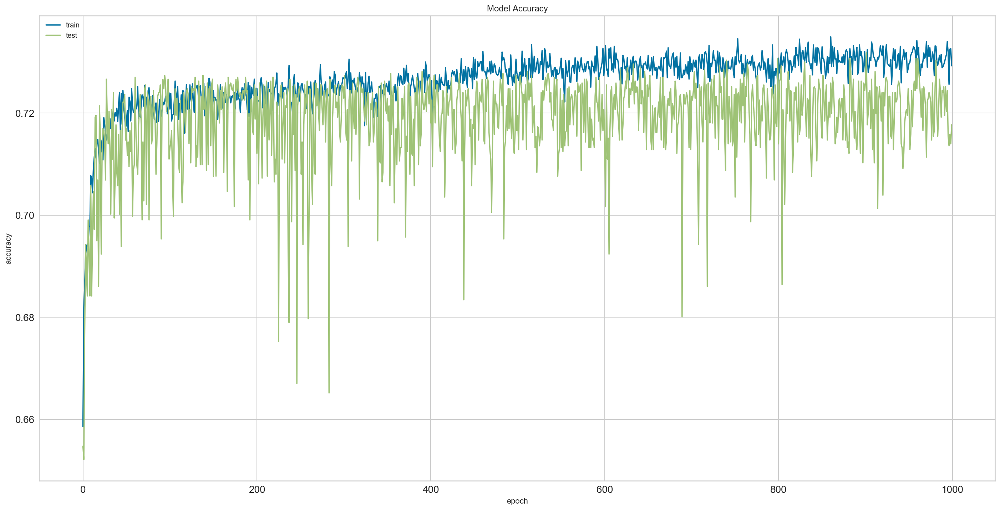

In [478]:
plt.figure(figsize=(24,12))
plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

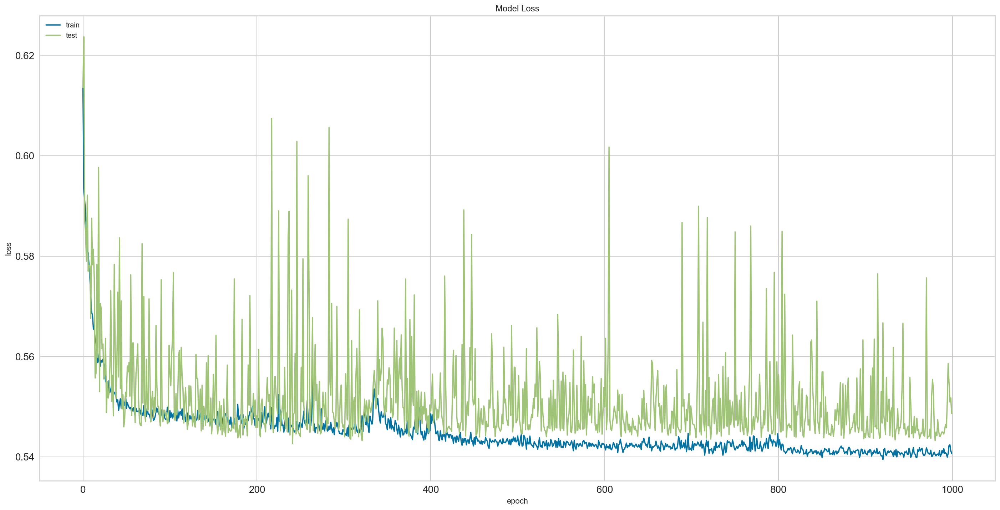

In [480]:
# summarize history for loss
plt.figure(figsize=(24,12))
plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

After evaluating the model we see that the loss is 0.54 and the accuracy is 0.71 which does not mean that it overfitted but it didn't provide better result than the previous machine learning models that we implemented.

From plotting the loss and the accuracy of our model, we see that the accuracy consistently increases till 100 epochs and then takes a slower ascent and basically plateaus at about 600 epochs. For the loss, we almost see the same results and see that the loss decreases consistently till about 100 epochs and basically plateaus at about 800 epochs

### Second Deep Learning Model
For the second Deep learning model, I decided to go with a different activation function and chose TanH. Everything else has been kept the same and the number of epochs has been reduced from 1000 to 500

In [465]:
model2 = keras.Sequential([
    keras.layers.Flatten(input_shape=(5,)),
    keras.layers.Dense(16, activation=tf.nn.tanh),
    keras.layers.Dense(16, activation=tf.nn.sigmoid),
    keras.layers.Dense(1, activation=tf.nn.sigmoid),
])

In [466]:
model2.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

History2 = model2.fit(X_train, y_train, validation_data = (X_test,y_test), epochs=500, batch_size=1)
#test_loss, test_acc = model.evaluate(X_test, y_test)

Train on 10737 samples, validate on 2685 samples
Epoch 1/500
10737/10737 [==============================] - 9s 847us/sample - loss: 0.6169 - accuracy: 0.6612 - val_loss: 0.5994 - val_accuracy: 0.6857
Epoch 2/500
10737/10737 [==============================] - 9s 838us/sample - loss: 0.5973 - accuracy: 0.6816 - val_loss: 0.5899 - val_accuracy: 0.6875
Epoch 3/500
10737/10737 [==============================] - 9s 844us/sample - loss: 0.5947 - accuracy: 0.6855 - val_loss: 0.6057 - val_accuracy: 0.6693
Epoch 4/500
10737/10737 [==============================] - 9s 845us/sample - loss: 0.5911 - accuracy: 0.6915 - val_loss: 0.5902 - val_accuracy: 0.6831
Epoch 5/500
10737/10737 [==============================] - 9s 835us/sample - loss: 0.5891 - accuracy: 0.6943 - val_loss: 0.5978 - val_accuracy: 0.6834
Epoch 6/500
10737/10737 [==============================] - 9s 840us/sample - loss: 0.5850 - accuracy: 0.6899 - val_loss: 0.5856 - val_accuracy: 0.6912
Epoch 7/500
10737/10737 [====================

10737/10737 [==============================] - 9s 829us/sample - loss: 0.5594 - accuracy: 0.7171 - val_loss: 0.5686 - val_accuracy: 0.7002
Epoch 54/500
10737/10737 [==============================] - 9s 814us/sample - loss: 0.5599 - accuracy: 0.7123 - val_loss: 0.5639 - val_accuracy: 0.6976
Epoch 55/500
10737/10737 [==============================] - 9s 814us/sample - loss: 0.5590 - accuracy: 0.7182 - val_loss: 0.5636 - val_accuracy: 0.7203
Epoch 56/500
10737/10737 [==============================] - 9s 817us/sample - loss: 0.5598 - accuracy: 0.7194 - val_loss: 0.5603 - val_accuracy: 0.7233
Epoch 57/500
10737/10737 [==============================] - 9s 815us/sample - loss: 0.5585 - accuracy: 0.7165 - val_loss: 0.5543 - val_accuracy: 0.7210
Epoch 58/500
10737/10737 [==============================] - 9s 829us/sample - loss: 0.5588 - accuracy: 0.7164 - val_loss: 0.5557 - val_accuracy: 0.7251
Epoch 59/500
10737/10737 [==============================] - 9s 814us/sample - loss: 0.5597 - accuracy

Epoch 107/500
10737/10737 [==============================] - 9s 827us/sample - loss: 0.5573 - accuracy: 0.7183 - val_loss: 0.5597 - val_accuracy: 0.7162
Epoch 108/500
10737/10737 [==============================] - 9s 823us/sample - loss: 0.5578 - accuracy: 0.7192 - val_loss: 0.5594 - val_accuracy: 0.7143
Epoch 109/500
10737/10737 [==============================] - 9s 835us/sample - loss: 0.5571 - accuracy: 0.7171 - val_loss: 0.5548 - val_accuracy: 0.7169
Epoch 110/500
10737/10737 [==============================] - 9s 812us/sample - loss: 0.5561 - accuracy: 0.7176 - val_loss: 0.5588 - val_accuracy: 0.7196
Epoch 111/500
10737/10737 [==============================] - 9s 822us/sample - loss: 0.5559 - accuracy: 0.7179 - val_loss: 0.5797 - val_accuracy: 0.7084
Epoch 112/500
10737/10737 [==============================] - 9s 839us/sample - loss: 0.5566 - accuracy: 0.7173 - val_loss: 0.5552 - val_accuracy: 0.7199
Epoch 113/500
10737/10737 [==============================] - 9s 824us/sample - los

10737/10737 [==============================] - 9s 841us/sample - loss: 0.5543 - accuracy: 0.7239 - val_loss: 0.5783 - val_accuracy: 0.7061
Epoch 161/500
10737/10737 [==============================] - 9s 805us/sample - loss: 0.5546 - accuracy: 0.7209 - val_loss: 0.5779 - val_accuracy: 0.7125
Epoch 162/500
10737/10737 [==============================] - 9s 826us/sample - loss: 0.5544 - accuracy: 0.7198 - val_loss: 0.5551 - val_accuracy: 0.7177
Epoch 163/500
10737/10737 [==============================] - 9s 838us/sample - loss: 0.5532 - accuracy: 0.7198 - val_loss: 0.5622 - val_accuracy: 0.7032
Epoch 164/500
10737/10737 [==============================] - 9s 820us/sample - loss: 0.5551 - accuracy: 0.7189 - val_loss: 0.5614 - val_accuracy: 0.7035
Epoch 165/500
10737/10737 [==============================] - 9s 825us/sample - loss: 0.5540 - accuracy: 0.7199 - val_loss: 0.5688 - val_accuracy: 0.7028
Epoch 166/500
10737/10737 [==============================] - 9s 812us/sample - loss: 0.5536 - ac

10737/10737 [==============================] - 9s 823us/sample - loss: 0.5532 - accuracy: 0.7205 - val_loss: 0.5503 - val_accuracy: 0.7233
Epoch 214/500
10737/10737 [==============================] - 9s 818us/sample - loss: 0.5539 - accuracy: 0.7197 - val_loss: 0.5563 - val_accuracy: 0.7270
Epoch 215/500
10737/10737 [==============================] - 9s 822us/sample - loss: 0.5531 - accuracy: 0.7206 - val_loss: 0.5524 - val_accuracy: 0.7251
Epoch 216/500
10737/10737 [==============================] - 9s 830us/sample - loss: 0.5539 - accuracy: 0.7210 - val_loss: 0.5531 - val_accuracy: 0.7166
Epoch 217/500
10737/10737 [==============================] - 9s 824us/sample - loss: 0.5516 - accuracy: 0.7223 - val_loss: 0.5600 - val_accuracy: 0.7255
Epoch 218/500
10737/10737 [==============================] - 9s 820us/sample - loss: 0.5540 - accuracy: 0.7189 - val_loss: 0.5556 - val_accuracy: 0.7244
Epoch 219/500
10737/10737 [==============================] - 9s 820us/sample - loss: 0.5531 - ac

10737/10737 [==============================] - 9s 826us/sample - loss: 0.5516 - accuracy: 0.7209 - val_loss: 0.6012 - val_accuracy: 0.6782
Epoch 267/500
10737/10737 [==============================] - 9s 814us/sample - loss: 0.5520 - accuracy: 0.7239 - val_loss: 0.5572 - val_accuracy: 0.7210
Epoch 268/500
10737/10737 [==============================] - 9s 824us/sample - loss: 0.5529 - accuracy: 0.7185 - val_loss: 0.5550 - val_accuracy: 0.7210
Epoch 269/500
10737/10737 [==============================] - 9s 827us/sample - loss: 0.5519 - accuracy: 0.7220 - val_loss: 0.5552 - val_accuracy: 0.7158
Epoch 270/500
10737/10737 [==============================] - 9s 826us/sample - loss: 0.5518 - accuracy: 0.7210 - val_loss: 0.5515 - val_accuracy: 0.7244
Epoch 271/500
10737/10737 [==============================] - 9s 811us/sample - loss: 0.5527 - accuracy: 0.7240 - val_loss: 0.5697 - val_accuracy: 0.7065
Epoch 272/500
10737/10737 [==============================] - 9s 824us/sample - loss: 0.5526 - ac

10737/10737 [==============================] - 9s 830us/sample - loss: 0.5524 - accuracy: 0.7231 - val_loss: 0.5529 - val_accuracy: 0.7240
Epoch 320/500
10737/10737 [==============================] - 9s 821us/sample - loss: 0.5511 - accuracy: 0.7221 - val_loss: 0.5522 - val_accuracy: 0.7229
Epoch 321/500
10737/10737 [==============================] - 9s 834us/sample - loss: 0.5520 - accuracy: 0.7200 - val_loss: 0.5517 - val_accuracy: 0.7155
Epoch 322/500
10737/10737 [==============================] - 9s 818us/sample - loss: 0.5528 - accuracy: 0.7228 - val_loss: 0.5527 - val_accuracy: 0.7173
Epoch 323/500
10737/10737 [==============================] - 9s 818us/sample - loss: 0.5529 - accuracy: 0.7223 - val_loss: 0.5530 - val_accuracy: 0.7229
Epoch 324/500
10737/10737 [==============================] - 9s 820us/sample - loss: 0.5520 - accuracy: 0.7224 - val_loss: 0.5565 - val_accuracy: 0.7095
Epoch 325/500
10737/10737 [==============================] - 9s 835us/sample - loss: 0.5530 - ac

10737/10737 [==============================] - 9s 821us/sample - loss: 0.5511 - accuracy: 0.7237 - val_loss: 0.5478 - val_accuracy: 0.7244
Epoch 373/500
10737/10737 [==============================] - 9s 820us/sample - loss: 0.5509 - accuracy: 0.7222 - val_loss: 0.5476 - val_accuracy: 0.7240
Epoch 374/500
10737/10737 [==============================] - 9s 829us/sample - loss: 0.5489 - accuracy: 0.7249 - val_loss: 0.5741 - val_accuracy: 0.7173
Epoch 375/500
10737/10737 [==============================] - 9s 822us/sample - loss: 0.5511 - accuracy: 0.7230 - val_loss: 0.5541 - val_accuracy: 0.7069
Epoch 376/500
10737/10737 [==============================] - 9s 832us/sample - loss: 0.5506 - accuracy: 0.7212 - val_loss: 0.5514 - val_accuracy: 0.7188
Epoch 377/500
10737/10737 [==============================] - 9s 823us/sample - loss: 0.5511 - accuracy: 0.7243 - val_loss: 0.5496 - val_accuracy: 0.7240
Epoch 378/500
10737/10737 [==============================] - 9s 818us/sample - loss: 0.5503 - ac

10737/10737 [==============================] - 9s 825us/sample - loss: 0.5483 - accuracy: 0.7225 - val_loss: 0.5481 - val_accuracy: 0.7251
Epoch 426/500
10737/10737 [==============================] - 9s 825us/sample - loss: 0.5508 - accuracy: 0.7229 - val_loss: 0.5547 - val_accuracy: 0.7102
Epoch 427/500
10737/10737 [==============================] - 9s 834us/sample - loss: 0.5499 - accuracy: 0.7205 - val_loss: 0.5632 - val_accuracy: 0.7024
Epoch 428/500
10737/10737 [==============================] - 9s 824us/sample - loss: 0.5480 - accuracy: 0.7257 - val_loss: 0.5557 - val_accuracy: 0.7061
Epoch 429/500
10737/10737 [==============================] - 9s 825us/sample - loss: 0.5508 - accuracy: 0.7239 - val_loss: 0.5546 - val_accuracy: 0.7233
Epoch 430/500
10737/10737 [==============================] - 9s 825us/sample - loss: 0.5502 - accuracy: 0.7246 - val_loss: 0.5500 - val_accuracy: 0.7244
Epoch 431/500
10737/10737 [==============================] - 9s 831us/sample - loss: 0.5494 - ac

10737/10737 [==============================] - 9s 823us/sample - loss: 0.5473 - accuracy: 0.7234 - val_loss: 0.5572 - val_accuracy: 0.7106
Epoch 479/500
10737/10737 [==============================] - 9s 819us/sample - loss: 0.5484 - accuracy: 0.7256 - val_loss: 0.5496 - val_accuracy: 0.7263
Epoch 480/500
10737/10737 [==============================] - 9s 819us/sample - loss: 0.5483 - accuracy: 0.7273 - val_loss: 0.5546 - val_accuracy: 0.7263
Epoch 481/500
10737/10737 [==============================] - 9s 817us/sample - loss: 0.5503 - accuracy: 0.7222 - val_loss: 0.5489 - val_accuracy: 0.7240
Epoch 482/500
10737/10737 [==============================] - 9s 817us/sample - loss: 0.5499 - accuracy: 0.7260 - val_loss: 0.5813 - val_accuracy: 0.6860
Epoch 483/500
10737/10737 [==============================] - 9s 819us/sample - loss: 0.5490 - accuracy: 0.7262 - val_loss: 0.5474 - val_accuracy: 0.7225
Epoch 484/500
10737/10737 [==============================] - 9s 831us/sample - loss: 0.5497 - ac

In [467]:
model2.evaluate(X_test,y_test)

2685/2685 [==============================] - 0s 14us/sample - loss: 0.5632 - accuracy: 0.7102


[0.5631782143253632, 0.7102421]

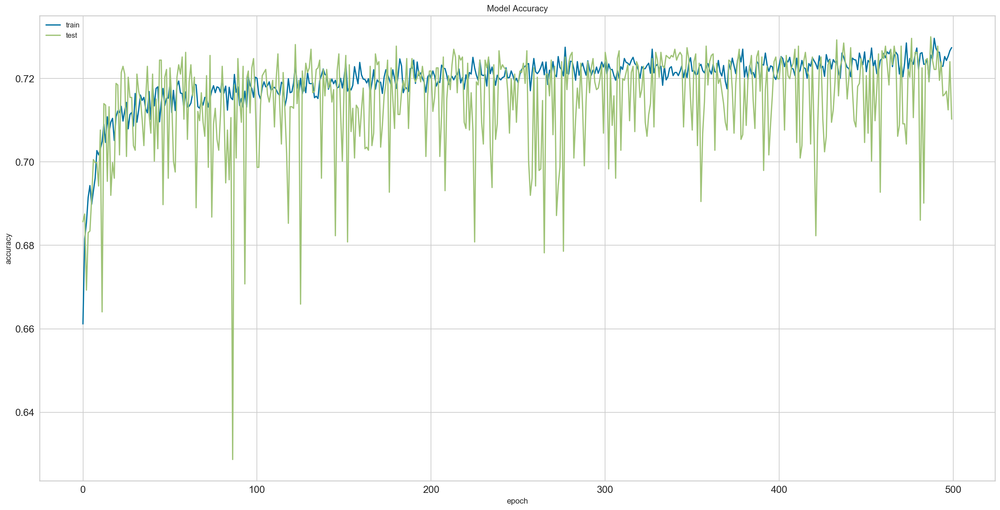

In [474]:
plt.figure(figsize=(24,12))
plt.plot(History2.history['accuracy'])
plt.plot(History2.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

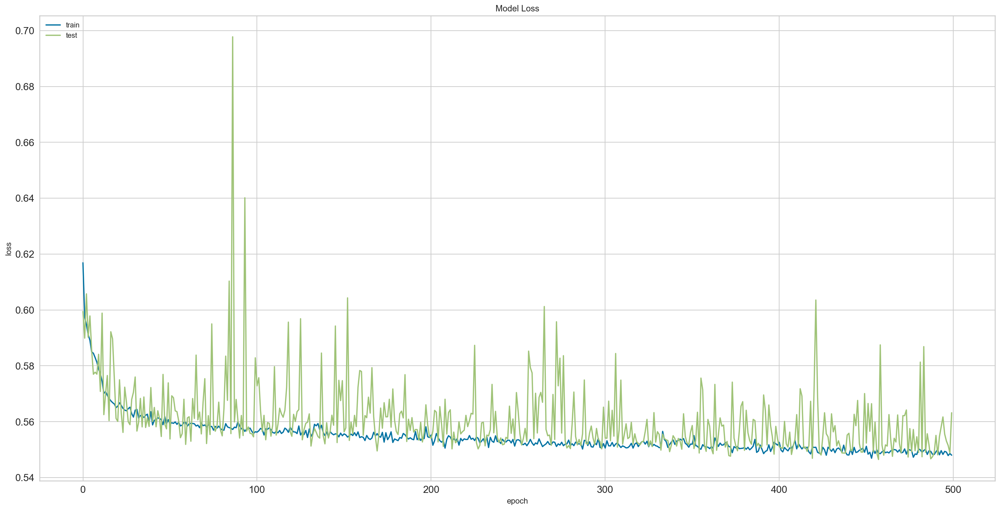

In [473]:
# summarize history for loss
plt.figure(figsize=(24,12))
plt.plot(History2.history['loss'])
plt.plot(History2.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

After evaluating the model we see that the loss is 0.56 and the accuracy is 0.71 which does not mean that it overfitted but it didn't provide better result than the previous machine learning models that we implemented but gave a sliiightly better result than the previous neural network.

From plotting the loss and the accuracy of our model, we see that the accuracy consistently increases till 100 epochs and then takes a slower ascent and basically plateaus at about 300 epochs. For the loss, we almost see the same results and see that the loss decreases consistently till about 100 epochs and basically plateaus at about 300 epochs




        
        
# Conclusion

With the data obtained from the Singapore Government weather website, I performed analysis and created models to predict the rainfall in the country.
As seen from the graphs, the temperatures have risen almost steadily over the years and the peak maximum temperature was reached in the years 1997 and 2020. However, we see that the mean temperature for the year of 2020 is the highest with 1997 trailing closely behind. We can see the same for the minimum temperatures too where 2020 logs the highest minimum temperature. It is also interesting to see that the year of 1984 records the least maximum, mean and minimum temperatures. It wouldn't be a mistake to crown it as the coolest year on record for Singapore. From the monthly analysis of the heat in Singapore we can see that the months of May and June are particularly hot and seem to log intense temperatures. 

The 1981-2010 long-term mean annual rainfall total is 2165.9mm. In addition to the heat, the region also experiences heavy rainfall, however we can see that the year of 2019 saw some of the least rainfall in all these years and 2007, the highest.

From the plots we can see that the years of 2010, 1985 and 1994 have the days with the highest maximum wind speed and similar can be said about the mean wind speed for those years.

After plotting the trends in the data, I performed univariate and multivariate anomaly detection. Univariate anomaly detection using the Isolation Forest model for the daily rainfall variable classified daily rainfall higher than 20 mm as an outlier. There are about 1,300 entries which the Isolation Forest consider to be outliers when contamination, or the proportion of outliers, is set to 0.1/10%. Also the Univariate anomaly detection using the Isolation Forest model for the temperature variable classifies all the temperature below 28.5 degrees celsius and the temperature above 33.8 degrees celsius as the outlier. There are about 1233 such outlier entries. 

The multivariate anomaly detection was done using 4 different PyOd models where Cluster-based Local Outlier Factor (CBLOF) classified 534 entries as the outliers and 12796 as inliers, Histogram-base Outlier Detection (HBOS) classified 526 entries as the outliers and 12804 as inliers, Isolation Forest classified 534 entries as the outliers and 12796 as inliers and the K Nearest Neighbors (KNN) classified 455 entries as the outliers and 12875 as inliers. There was breakdown analysis performed on these outliers next.


After the anomaly detection, Modeling of the data was done to predict the rainfall where the first model, the XGB model correctly classified 23 out of days 31 giving it an accuracy score of 0.75. The model wrongly predicted that it would rain on 3 days, when they were in fact sunny (false positives). It also wrongly predicted 5 sunny days when it in fact rained on those days (false negatives). The XGB model is weakest in terms of its recall score, in this case meaning its ability to correctly identify rainy days as such (9 out of 14). 

The second model, the logistic regression model model correctly classified 25 out of 31 days giving it an accuracy score of 0.80. The model wrongly predicted that it would rain on 2 days, when they were in fact sunny (false positives). It also wrongly predicted 4 sunny days when it in fact rained on those days (false negatives). The Logistic Regression model is weak in terms of its recall score, in this case meaning its ability to correctly identify rainy days as such (10 out of 14).

After the classic machine learning approach, I made 2 deep learning models . The first one has the ReLu activation function. After evaluating the model we see that the loss is 0.54 and the accuracy is 0.71 which does not mean that it overfitted but it didn't provide better result than the previous machine learning models that we implemented.
From plotting the loss and the accuracy of our model, we see that the accuracy consistently increases till 100 epochs and then takes a slower ascent and basically plateaus at about 600 epochs. For the loss, we almost see the same results and see that the loss decreases consistently till about 100 epochs and basically plateaus at about 800 epochs

The second one has the TanH activation function. After evaluating the model we see that the loss is 0.56 and the accuracy is 0.71 which does not mean that it overfitted but it didn't provide better result than the previous machine learning models that we implemented but gave a sliiightly better result than the previous neural network.
From plotting the loss and the accuracy of our model, we see that the accuracy consistently increases till 100 epochs and then takes a slower ascent and basically plateaus at about 300 epochs. For the loss, we almost see the same results and see that the loss decreases consistently till about 100 epochs and basically plateaus at about 300 epochs



# Citations

[XGBoost 1](https://machinelearningmastery.com/develop-first-xgboost-model-python-scikit-learn/)

[XGBoost 2](https://hackernoon.com/want-a-complete-guide-for-xgboost-model-in-python-using-scikit-learn-sc11f31bq)

[Deep Learning](https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/)

[Optimizers](https://keras.io/optimizers/)

[EDA](https://cambridgespark.com/eda-and-interactive-figures-with-plotly/)

[Plotly](https://towardsdatascience.com/plotly-express-the-good-the-bad-and-the-ugly-dc941649687c)

[Plotly](https://github.com/chuachinhon/weather_singapore_cch/blob/master/notebooks/2.0_visualisation_cch.ipynb)

[Joyplots](https://n-o-r.xyz/2018/04/12/pyjoyplot.html)

[Anomaly Detection 1](https://github.com/susanli2016/Machine-Learning-with-Python/blob/master/Anomaly_Detection_for_Dummies.ipynb)

[Anomaly Detection 2](https://www.analyticsvidhya.com/blog/2019/02/outlier-detection-python-pyod/)

[Skewness and Kurtosis](https://codeburst.io/2-important-statistics-terms-you-need-to-know-in-data-science-skewness-and-kurtosis-388fef94eeaa)

[Scikit learn pipeline 1](https://towardsdatascience.com/a-simple-example-of-pipeline-in-machine-learning-with-scikit-learn-e726ffbb6976)

[Scikit learn pipeline 2](https://www.kaggle.com/baghern/a-deep-dive-into-sklearn-pipelines)

[Evaluating performance of Deep Learning models](https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/)

[Climate Analysis](http://www.weather.gov.sg/climate-climate-of-singapore/)


# License
MIT License

Copyright (c) 2020 Krisha Shah

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.